In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
import time

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

sys.path.append(os.environ['REPO_DIR'] + '/utilities')
from utilities2015 import *
from registration_utilities import *
from data_manager import *
from metadata import *

/usr/local/lib/python2.7/dist-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


Setting environment for AWS compute node


No vtk


In [2]:
stack_fixed = 'MD589'
# stack_moving = 'MD594'
# stack_moving = 'MD589'
stack_moving = 'MD585'

In [3]:
volume_fixed, structure_to_label_fixed, label_to_structure_fixed = \
DataManager.load_original_volume_all_known_structures(stack=stack_fixed, volume_type='annotationAsScore', sided=True)

vol_fixed_xmin, vol_fixed_xmax, vol_fixed_ymin, vol_fixed_ymax, vol_fixed_zmin, vol_fixed_zmax = \
DataManager.load_original_volume_bbox(stack=stack_fixed, volume_type='annotation')

Prior structure/index map not found. Generating a new one.


rm -rf "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_outerContour.bp" && mkdir -p "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes"
aws s3 cp "s3://mousebrainatlas-data/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_outerContour.bp" "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_outerContour.bp"


File does not exist: /shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_outerContour.bp
Score volume for outerContour does not exist: [Errno 2] No such file or directory: '/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_outerContour.bp'


rm -rf "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_sp5.bp" && mkdir -p "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes"
aws s3 cp "s3://mousebrainatlas-data/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_sp5.bp" "/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_sp5.bp"


File does not exist: /shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_sp5.bp
Score volume for sp5 does not exist: [Errno 2] No such file or directory: '/shared/CSHL_volumes/MD589/MD589_down32_annotationAsScoreVolume/score_volumes/MD589_down32_annotationAsScoreVolume_sp5.bp'
Volume shape: (348, 421, 376)


In [4]:
volume_moving, structure_to_label_moving, label_to_structure_moving = \
DataManager.load_original_volume_all_known_structures(stack=stack_moving, volume_type='annotationAsScore', sided=True)

vol_moving_xmin, vol_moving_xmax, vol_moving_ymin, vol_moving_ymax, vol_moving_zmin, vol_moving_zmax = \
DataManager.load_original_volume_bbox(stack=stack_fixed, volume_type='annotation')

Prior structure/index map not found. Generating a new one.


rm -rf "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_outerContour.bp" && mkdir -p "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes"
aws s3 cp "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_outerContour.bp" "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_outerContour.bp"


File does not exist: /shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_outerContour.bp
Score volume for outerContour does not exist: [Errno 2] No such file or directory: '/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_outerContour.bp'


rm -rf "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_sp5.bp" && mkdir -p "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes"
aws s3 cp "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_sp5.bp" "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_sp5.bp"


File does not exist: /shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_sp5.bp
Score volume for sp5 does not exist: [Errno 2] No such file or directory: '/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_sp5.bp'
Volume shape: (327, 518, 366)


In [5]:
ydim_f, xdim_f, zdim_f = volume_fixed.values()[0].shape
ydim_m, xdim_m, zdim_m = volume_moving.values()[0].shape

# Align mid-sagittal planes

In [6]:
def get_structure_centroids(vol_bbox_dict=None, vol_dict=None):
    structure_centroids = {}
    if vol_bbox_dict is not None:
        for label, (v, bb) in vol_bbox_dict.iteritems():
            xmin, _, ymin, _, zmin, _ = bb
            ym, xm, zm = np.mean(np.nonzero(v), axis=1)
            structure_centroids[label] = (xm+xmin, ym+ymin, zm+zmin)
    elif vol_dict is not None:
        for label, v in vol_dict.iteritems():
            ym, xm, zm = np.mean(np.nonzero(v), axis=1)
            structure_centroids[label] = (xm, ym, zm)
    return structure_centroids

def compute_midpoints(structure_centroids):
    """
    Compute the mid-points of each structure.
    
    Args:
        structure_centroids (dict of dict): {sided name: (centroid x,y,z)}
    
    Returns:
        dict of (3,)-array: {unsided name: mid-point}
    """
    midpoints = {}
    for s in all_known_structures:
        if s in singular_structures:
            if s not in structure_centroids:
                continue
            c = np.array(structure_centroids[s])
        else:
            sl = convert_to_left_name(s)
            sr = convert_to_right_name(s)
            if sl not in structure_centroids or sr not in structure_centroids:
                continue
            c = (np.array(structure_centroids[sl]) + np.array(structure_centroids[sr]))/2
        midpoints[s] = c
    return midpoints

In [7]:
# from mpl_toolkits.mplot3d import Axes3D

# fig = plt.figure(figsize=(10,10));
# ax = fig.add_subplot(111, projection='3d')
# for label, c in structure_centroids_fixed.iteritems():
#     ax.scatter(c[0], c[1], c[2], c=structure_unsided_to_colors[convert_to_original_name(label)], marker='o')
# ax.set_xlabel('tx')
# ax.set_ylabel('ty')
# ax.set_zlabel('tz')
# ax.view_init(elev=30, azim=0)
# # for i, (x,y,z) in enumerate(xyz_trajectory[::5]):
# #     ax.text(x,y,z,str(i))
# plt.show()

In [8]:
structure_centroids_fixed_rel2fixed = get_structure_centroids(vol_dict=volume_fixed)
structure_centroids_moving_rel2moving = get_structure_centroids(vol_dict=volume_moving)

structure_centroids_fixed_rel2fixed = {label_to_structure_fixed[i]: c for i, c in structure_centroids_fixed_rel2fixed.iteritems()}
structure_centroids_moving_rel2moving = {label_to_structure_moving[i]: c for i, c in structure_centroids_moving_rel2moving.iteritems()}

In [9]:
# for label, c in structure_centroids_fixed.iteritems():
#     plt.scatter(c[1], c[2], c=structure_unsided_to_colors[convert_to_original_name(label)], marker='o')
# plt.xlabel('x');
# plt.ylabel('z');
# plt.title('structure centroids, fixed');
# plt.show()
    
# for label, c in structure_centroids_moving.iteritems():
#     plt.scatter(c[1], c[2], c=structure_unsided_to_colors[convert_to_original_name(label)], marker='o')
# plt.xlabel('x');
# plt.ylabel('z');
# plt.title('structure centroids, moving');
# plt.show()

In [10]:
midplane_points_fixed_rel2fixed = compute_midpoints(structure_centroids_fixed_rel2fixed)
midplane_vector_fixed, midplane_centroid_fixed_rel2fixed = fit_plane(midplane_points_fixed_rel2fixed.values())

In [11]:
midplane_points_moving_rel2moving = compute_midpoints(structure_centroids_moving_rel2moving)
midplane_vector_moving, midplane_centroid_moving_rel2moving = fit_plane(midplane_points_moving_rel2moving.values())

In [12]:
# for name_u, c in midplane_points_fixed.iteritems():
#     plt.scatter(c[1], c[2], c=structure_unsided_to_colors[name_u], marker='o')
    
# d = 100
# e1 = midplane_centroid_fixed - midplane_vector_fixed * d
# e2 = midplane_centroid_fixed + midplane_vector_fixed * d
# plt.plot([e1[1], e2[1]], [e1[2], e2[2]])
    
# plt.ylim([0, zdim_f]);
# plt.xlim([0, xdim_f]);
# plt.xlabel('x');
# plt.ylabel('z');
# plt.title('midpoints, fixed');
# plt.show()

# ####################

# for name_u, c in midplane_points_moving.iteritems():
#     plt.scatter(c[1], c[2], c=structure_unsided_to_colors[name_u], marker='o')

# d = 100
# e1 = midplane_centroid_moving - midplane_vector_moving * d
# e2 = midplane_centroid_moving + midplane_vector_moving * d
# plt.plot([e1[1], e2[1]], [e1[2], e2[2]])
    
# plt.ylim([0, zdim_m]);
# plt.xlim([0, xdim_m]);    
# plt.xlabel('x');
# plt.ylabel('z');
# plt.title('midpoints, moving');
# plt.show()

In [13]:
R = R_align_two_vectors(midplane_vector_moving, midplane_vector_fixed)

In [14]:
T_align_midplane = np.zeros((3,4))
T_align_midplane[:3, :3] = R
T_align_midplane = T_align_midplane.flatten()

print T_align_midplane.reshape((3,4))

[[ 0.99714399 -0.00305889  0.07546991  0.        ]
 [ 0.00731393  0.99839416 -0.05618078  0.        ]
 [-0.07517693  0.05657223  0.99556511  0.        ]]


In [15]:
volume_moving_midplaneAligned_rel2fixed = {label_s: transform_volume_v2(vol=vol, 
                                                          tf_params=T_align_midplane, 
                                                          centroid_m=midplane_centroid_moving_rel2moving, 
                                                          centroid_f=midplane_centroid_fixed_rel2fixed) 
                                  for label_s, vol in volume_moving.iteritems()}

In [16]:
# volume_moving_midplane_aligned = \
# {label_s: crop_and_pad_volume(vol_inbbox, bbox, out_bbox=(0, xdim_f-1, 0, ydim_f-1, 0, zdim_f-1)) 
#  for label_s, (vol_inbbox, bbox) in volume_moving_midplane_aligned.iteritems()}

In [17]:
structure_centroids_m_midplaneAligned_rel2fixed = get_structure_centroids(vol_bbox_dict=volume_moving_midplaneAligned_rel2fixed)
structure_centroids_m_midplaneAligned_rel2fixed = {label_to_structure_moving[i]: c 
                                          for i, c in structure_centroids_m_midplaneAligned_rel2fixed.iteritems()}

In [18]:
midplane_points_m_midplaneAligned_rel2fixed = compute_midpoints(structure_centroids_m_midplaneAligned_rel2fixed)

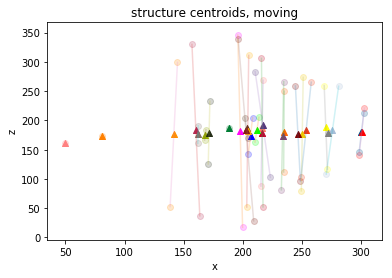

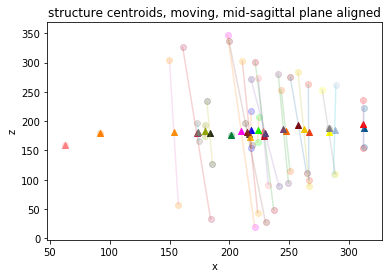

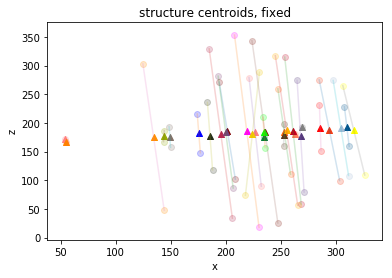

In [19]:
for name_s, c in structure_centroids_moving_rel2moving.iteritems():
    plt.scatter(c[1], c[2], c=np.array(name_unsided_to_color[convert_to_original_name(name_s)])/255., 
                marker='o', alpha=.2)
    
for name_u, c in midplane_points_moving_rel2moving.iteritems():
    plt.scatter(c[1], c[2], c=np.array(name_unsided_to_color[name_u])/255., marker='^')
    
for name_u in set([convert_to_original_name(name_s) for name_s in structure_centroids_moving_rel2moving.keys()]):
    if name_u not in singular_structures:
        name_l = convert_to_left_name(name_u)
        name_r = convert_to_right_name(name_u)
        if name_l in structure_centroids_moving_rel2moving:
            e1 = structure_centroids_moving_rel2moving[name_l]
        if name_r in structure_centroids_moving_rel2moving:
            e2 = structure_centroids_moving_rel2moving[name_r]
        plt.plot((e1[1], e2[1]), (e1[2], e2[2]), alpha=.2);
    
plt.xlabel('x');
plt.ylabel('z');
plt.title('structure centroids, moving');
plt.show()

##########################################################

for name_s, c in structure_centroids_m_midplaneAligned_rel2fixed.iteritems():
    plt.scatter(c[1], c[2], c=np.array(name_unsided_to_color[convert_to_original_name(name_s)])/255., 
                marker='o', alpha=.2)

for name_u, c in midplane_points_m_midplaneAligned_rel2fixed.iteritems():
    plt.scatter(c[1], c[2], c=np.array(name_unsided_to_color[name_u])/255., marker='^')
    
for name_u in set([convert_to_original_name(name_s) for name_s in structure_centroids_m_midplaneAligned_rel2fixed.keys()]):
    if name_u not in singular_structures:
        name_l = convert_to_left_name(name_u)
        name_r = convert_to_right_name(name_u)
        if name_l in structure_centroids_m_midplaneAligned_rel2fixed:
            e1 = structure_centroids_m_midplaneAligned_rel2fixed[name_l]
        if name_r in structure_centroids_m_midplaneAligned_rel2fixed:
            e2 = structure_centroids_m_midplaneAligned_rel2fixed[name_r]
        plt.plot((e1[1], e2[1]), (e1[2], e2[2]), alpha=.2);   
    
    
plt.xlabel('x');
plt.ylabel('z');
plt.title('structure centroids, moving, mid-sagittal plane aligned');
plt.show()

##########################################################

for name_s, c in structure_centroids_fixed_rel2fixed.iteritems():
    plt.scatter(c[1], c[2], c=np.array(name_unsided_to_color[convert_to_original_name(name_s)])/255., 
                marker='o', alpha=.2)
    
for name_u, c in midplane_points_fixed_rel2fixed.iteritems():
    plt.scatter(c[1], c[2], c=np.array(name_unsided_to_color[name_u])/255., marker='^')
    
for name_u in set([convert_to_original_name(name_s) for name_s in structure_centroids_fixed_rel2fixed.keys()]):
    if name_u not in singular_structures:
        name_l = convert_to_left_name(name_u)
        name_r = convert_to_right_name(name_u)
        if name_l in structure_centroids_fixed_rel2fixed:
            e1 = structure_centroids_fixed_rel2fixed[name_l]
        if name_r in structure_centroids_fixed_rel2fixed:
            e2 = structure_centroids_fixed_rel2fixed[name_r]
        plt.plot((e1[1], e2[1]), (e1[2], e2[2]), alpha=.2);
    
plt.xlabel('x');
plt.ylabel('z');
plt.title('structure centroids, fixed');
plt.show()

In [20]:
# Save mid-sagittal plane aligned annotationAsScore volumes.

for label, (vol, bbox_rel2fixed) in volume_moving_midplaneAligned_rel2fixed.iteritems():
    
    vol_fp = \
    DataManager.get_transformed_volume_filepath(stack_m=stack_moving, stack_f=stack_fixed, 
                                                structure=label_to_structure_moving[label], 
                                                vol_type_m='annotationAsScore', 
                                                vol_type_f='annotationAsScore', 
                                                warp_setting=8)
    
    create_parent_dir_if_not_exists(vol_fp)
    bp.pack_ndarray_file(vol, vol_fp)
    upload_to_s3(vol_fp)
    
    bbox_fp = \
    DataManager.get_transformed_volume_bbox_filepath(stack_m=stack_moving, stack_f=stack_fixed, 
                                                structure=label_to_structure_moving[label], 
                                                vol_type_m='annotationAsScore', 
                                                vol_type_f='annotationAsScore', 
                                                warp_setting=8)
    create_parent_dir_if_not_exists(bbox_fp)
    np.savetxt(bbox_fp, bbox_rel2fixed)
    upload_to_s3(bbox_fp)

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_10N_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_10N_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_10N_L_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_10N_L_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD5

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_6N_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_6N_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_6N_L_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_6N_L_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_d

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_DC_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_DC_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_DC_L_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_DC_L_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_d

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_Pn_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_Pn_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_Pn_L_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_Pn_L_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_d

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_SNR_R.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_SNR_R.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_SNR_R_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_SNR_R_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD5

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_VCA_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_VCA_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_VCA_L_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp8_MD589_down32_annotationAsScoreVolume_VCA_L_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp8_MD5

In [21]:
volume_moving_midplaneAligned_overall,\
volume_moving_midplaneAligned_bbox_rel2fixed = convert_vol_bbox_dict_to_overall_vol(vol_bbox_dict=volume_moving_midplaneAligned_rel2fixed)

In [22]:
# volume_m_int_midplane_aligned2 = crop_and_pad_volume(volume_m_int_midplane_aligned_inbbox,
#                                                     volume_m_int_midplane_aligned_bbox_rel2fixed,
#                                                     volume_m_int_midplane_aligned_bbox_rel2fixed)

In [22]:
# Save mid-sagittal plane aligned integer-valued volume.

volume_m_int = DataManager.load_annotation_volume(stack=stack_moving, downscale=32)

volume_m_int_midplaneAligned_inbbox, volume_m_int_midplaneAligned_bbox_rel2fixed = transform_volume_v2(vol=volume_m_int, 
                                                    tf_params=T_align_midplane, 
                                                    centroid_m=midplane_centroid_moving_rel2moving, 
                                                    centroid_f=midplane_centroid_fixed_rel2fixed)

In [23]:
vol_fp = DataManager.get_transformed_volume_filepath(stack_m=stack_moving, vol_type_m='annotation',
                                                        stack_f=stack_fixed, vol_type_f='annotation',
                                                        warp_setting=8)
create_parent_dir_if_not_exists(vol_fp)
bp.pack_ndarray_file(volume_m_int_midplaneAligned_inbbox, vol_fp)
upload_to_s3(vol_fp)

bbox_fp = DataManager.get_transformed_volume_bbox_filepath(stack_m=stack_moving, vol_type_m='annotation',
                                                        stack_f=stack_fixed, vol_type_f='annotation',
                                                        warp_setting=8)
create_parent_dir_if_not_exists(bbox_fp)
np.savetxt(bbox_fp, volume_m_int_midplaneAligned_bbox_rel2fixed)
upload_to_s3(bbox_fp)

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationVolume_warp8_MD589_down32_annotationVolume/score_volumes/MD594_down32_annotationVolume_warp8_MD589_down32_annotationVolume.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationVolume_warp8_MD589_down32_annotationVolume/score_volumes/MD594_down32_annotationVolume_warp8_MD589_down32_annotationVolume.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationVolume_warp8_MD589_down32_annotationVolume/score_volumes/MD594_down32_annotationVolume_warp8_MD589_down32_annotationVolume_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationVolume_warp8_MD589_down32_annotationVolume/score_volumes/MD594_down32_annotationVolume_warp8_MD589_down32_annotationVolume_bbox.txt"


# Affine registration, under the constaint that mid-sagittal plane is aligned.

In [24]:
warp_setting = 9

In [25]:
registration_settings = read_csv(REGISTRATION_SETTINGS_CSV, header=0, index_col=0)
registration_settings

,upstream_warp_id,transform_type,terminate_thresh,grad_computation_sample_number,grid_search_sample_number,std_tx_um,std_ty_um,std_tz_um,std_theta_xy_degree,surround_weight,regularization_weight,comment
warp_id,,,,,,,,,,,,
1,None,affine,0.000010,100000.0,1000.0,2000,2000,2000,30,0,NaN,NaN
2,1,rigid,0.000010,100000.0,10000.0,100,100,100,30,0,NaN,NaN
4,1,rigid,0.000001,100000.0,10000.0,100,100,100,10,0,0.000001,NaN
5,1,rigid,0.000001,100000.0,10000.0,100,100,100,30,inverse,0.000000,NaN
6,1,affine,0.000010,100000.0,10000.0,100,100,100,30,-0.5,0.000000,NaN
7,None,rigid,0.000001,100000.0,1000.0,50,50,50,10,0,NaN,NaN
8,None,rigid,0.000001,100000.0,10000.0,200,200,200,30,inverse,0.000000,align mid-sagittal planes
9,8,rigid,0.000001,100000.0,10000.0,2000,2000,2000,30,NaN,NaN,global registration given mid-sagittal planes ...
18,8,affine,0.000001,100000.0,10000.0,200,200,200,30,NaN,NaN,global registration given mid-sagittal planes ...


In [26]:
warp_properties = registration_settings.loc[warp_setting]
print warp_properties

upstream_warp_setting = warp_properties['upstream_warp_id']
if upstream_warp_setting == 'None':
    upstream_warp_setting = None
else:
    upstream_warp_setting = int(upstream_warp_setting)
    
transform_type = warp_properties['transform_type']
terminate_thresh = warp_properties['terminate_thresh']
grad_computation_sample_number = warp_properties['grad_computation_sample_number']
grid_search_sample_number = warp_properties['grid_search_sample_number']
std_tx_um = warp_properties['std_tx_um']
std_ty_um = warp_properties['std_ty_um']
std_tz_um = warp_properties['std_tz_um']
std_tx = std_tx_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_ty = std_ty_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_tz = std_tz_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_theta_xy = np.deg2rad(warp_properties['std_theta_xy_degree'])
print std_tx, std_ty, std_tz, std_theta_xy

# try:
#     surround_weight = float(warp_properties['surround_weight'])
#     include_surround = surround_weight != 0 and not np.isnan(surround_weight)
# except:
#     surround_weight = str(warp_properties['surround_weight'])
#     # Setting surround_weight as inverse is very important. Using -1 often gives false peaks.
#     include_surround = True

upstream_warp_id                                                                  8
transform_type                                                                rigid
terminate_thresh                                                              1e-06
grad_computation_sample_number                                               100000
grid_search_sample_number                                                     10000
std_tx_um                                                                      2000
std_ty_um                                                                      2000
std_tz_um                                                                      2000
std_theta_xy_degree                                                              30
surround_weight                                                                 NaN
regularization_weight                                                           NaN
comment                           global registration given mid-sagittal pla

In [27]:
# if surround_weight == 'inverse':
#     if 'volume_moving_structure_sizes' not in locals():
#         # not in local namespace, not been computed
#         volume_moving_structure_sizes = {l: np.count_nonzero(vol > 0) for l, vol in volume_moving.iteritems()}
        
#     label_weights_m = {label_m: -volume_moving_structure_sizes[structure_to_label_moving[convert_to_nonsurround_name(name_m)]]
#                        /float(volume_moving_structure_sizes[label_m])
#                        if is_surround_label(name_m) else 1. \
#                        for label_m, name_m in label_to_structure_moving.iteritems()}
# elif isinstance(surround_weight, int) or isinstance(surround_weight, float):
#     label_weights_m = {label_m: surround_weight if is_surround_label(name_m) else 1. \
#                    for label_m, name_m in label_to_structure_moving.iteritems()}
# else:
#     sys.stderr.write("surround_weight %s is not recognized. Using the default.\n" % surround_weight)

In [28]:
volume_moving_structure_sizes = {l: np.count_nonzero(vol > 0) for l, vol in volume_moving.iteritems()}

In [29]:
label_weights_m = {}
for label_m, name_m in label_to_structure_moving.iteritems():
    if 'surround' in name_m:
        label_weights_m[label_m] = 0
    else:
#         label_weights_m[label_m] = 1
        label_weights_m[label_m] = np.minimum(1e5 / volume_moving_structure_sizes[label_m], 1.)

In [30]:
structure_subset = all_known_structures_sided

# structure_subset = ['7N_L', '7N_R', '12N', '5N_L','5N_R','Pn_L', 'Pn_R', 'SNR_L', 'SNR_R', 
#                     'VLL_L', 'VLL_R', '7n_L', '7n_R', 'Tz_L', 'Tz_R', 
#                     'VCA_L', 'VCA_R', 'VCP_L', 'VCP_R',
#                    'Sp5C_L', 'Sp5C_R', 'IC', 'SC', '12N', '10N_L', '10N_R', 'AP', 'DC_L', 'DC_R']

# structure_subset = ['IC']

label_mapping_m2f = {label_m: structure_to_label_fixed[name_m] 
                     for label_m, name_m in label_to_structure_moving.iteritems()
                     if name_m in structure_subset}

In [31]:
aligner = Aligner4(volume_fixed, volume_moving_midplaneAligned_overall, labelIndexMap_m2f=label_mapping_m2f)

Label weights not set, default to 1 for all structures.
Regularization weights not set, default to 0.


In [32]:
aligner.set_centroid(centroid_m='volume_centroid', centroid_f='volume_centroid')
# aligner.set_centroid(centroid_m='structure_centroid', centroid_f='centroid_m', indices_m=[structure_to_label_moving['IC']])

m: [ 254.5  162.   183.5] f: [ 210.5  174.   188. ]


In [33]:
# Grid search is not necessary. 

# grid_search_T, grid_search_score = aligner.do_grid_search(grid_search_iteration_number=1000, 
#                        grid_search_sample_number=10,
#                       std_tx=std_tx, std_ty=std_ty, std_tz=0, std_theta_xy=0,
#                        grid_search_eta=3.)

sigma_tx: 135.87 (voxel), sigma_ty: 135.87, sigma_tz: 0.00, sigma_theta_xy: 0.00 (deg), n:10
grid search: 21.944672 seconds
tx_best: 75.48 (voxel), ty_best: -15.10, tz_best: 0.00, theta_xy_best: 0.00 (deg), score=1.323437
New best: -inf 1.323437
sigma_tx: 97.35 (voxel), sigma_ty: 97.35, sigma_tz: 0.00, sigma_theta_xy: 0.00 (deg), n:10
grid search: 24.856655 seconds
tx_best: 86.30 (voxel), ty_best: -25.91, tz_best: 0.00, theta_xy_best: 0.00 (deg), score=1.499382
New best: 1.323437 1.499382
sigma_tx: 69.76 (voxel), sigma_ty: 69.76, sigma_tz: 0.00, sigma_theta_xy: 0.00 (deg), n:10
grid search: 24.252755 seconds
tx_best: 78.55 (voxel), ty_best: -33.66, tz_best: 0.00, theta_xy_best: 0.00 (deg), score=1.467581
sigma_tx: 49.98 (voxel), sigma_ty: 49.98, sigma_tz: 0.00, sigma_theta_xy: 0.00 (deg), n:10
grid search: 25.552972 seconds
tx_best: 80.75 (voxel), ty_best: -31.47, tz_best: 0.00, theta_xy_best: 0.00 (deg), score=1.505773
New best: 1.499382 1.505773
sigma_tx: 35.81 (voxel), sigma_ty: 35.

In [34]:
gradient_filepath_map_f = {ind_f: DataManager.get_volume_gradient_filepath_template(\
                            stack=stack_fixed, structure=label_to_structure_fixed[ind_f],
                            downscale=32, volume_type='annotationAsScore')
                           for ind_m, ind_f in label_mapping_m2f.iteritems()}

In [35]:
aligner.load_gradient(gradient_filepath_map_f=gradient_filepath_map_f)

set([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51])


load gradient 1: 1.088309 seconds
load gradient 2: 1.088651 seconds
load gradient 3: 1.089041 seconds
load gradient 4: 1.087351 seconds
load gradient 5: 1.088456 seconds
load gradient 6: 1.087774 seconds
load gradient 7: 1.086261 seconds
load gradient 8: 1.089132 seconds
load gradient 9: 1.089339 seconds
load gradient 10: 1.087639 seconds
load gradient 11: 1.087572 seconds
load gradient 12: 1.088751 seconds
load gradient 13: 1.090235 seconds
load gradient 14: 1.089699 seconds
load gradient 15: 1.088588 seconds
load gradient 16: 1.089049 seconds
load gradient 17: 1.086858 seconds
load gradient 18: 1.086050 seconds
load gradient 19: 1.085792 seconds
load gradient 20: 1.087144 seconds
load gradient 21: 1.093652 seconds
load gradient 22: 1.106588 seconds
load gradient 23: 2.050274 seconds
load gradient 24: 2.066958 seconds
load gradient 25: 2.060077 seconds
load gradient 26: 2.052142 seconds
load gradient 27: 2.060690 seconds
load gradient 28: 2.050375 seconds
load gradient 29: 2.055045 se

In [36]:
aligner.set_label_weights(label_weights=label_weights_m)

In [67]:
# T = grid_search_T

In [37]:
T, scores = aligner.optimize(tf_type=transform_type, 
                             max_iter_num=1000,
                             history_len=50, 
                             terminate_thresh=1e-4,
                             grad_computation_sample_number=100000,
                             full_lr=np.array([10,10,0,0,0,.1]),
#                              init_T=grid_search_T
                            )
                                    
traj = aligner.Ts


iteration 0
1: 4038 samples out of 4038
2: 3970 samples out of 3970
3: 45232 samples out of 45232
4: 5719 samples out of 5719
5: 7139 samples out of 7139
6: 820 samples out of 820
7: 656 samples out of 656
8: 30254 samples out of 30254
9: 25096 samples out of 25096
10: 1408 samples out of 1408
11: 1501 samples out of 1501
12: 59502 samples out of 59502
13: 61637 samples out of 61637
14: 23455 samples out of 23455
15: 22447 samples out of 22447
16: 6994 samples out of 6994
17: 1542 samples out of 1542
18: 1714 samples out of 1714
19: 39724 samples out of 39724
20: 39812 samples out of 39812
21: 100000 samples out of 692795
22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 39589 samples out of 39589
25: 44811 samples out of 44811
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 990109

9: 25096 samples out of 25096
10: 1408 samples out of 1408
11: 1501 samples out of 1501
12: 59502 samples out of 59502
13: 61637 samples out of 61637
14: 23455 samples out of 23455
15: 22447 samples out of 22447
16: 6994 samples out of 6994
17: 1542 samples out of 1542
18: 1714 samples out of 1714
19: 39724 samples out of 39724
20: 39812 samples out of 39812
21: 100000 samples out of 692795
22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 39589 samples out of 39589
25: 44811 samples out of 44811
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1242973
34: 10134 samples out of 10134
35: 6667 samples out of 6667
36: 100000 samples out of 161567
37: 100000 samples out of 158020
38: 100000 samples out of 190900
39: 100000 samples out of 110526
40: 25042 samples out of 25042
41: 57843 sa

9: 25096 samples out of 25096
10: 1408 samples out of 1408
11: 1501 samples out of 1501
12: 59502 samples out of 59502
13: 61637 samples out of 61637
14: 23455 samples out of 23455
15: 22447 samples out of 22447
16: 6994 samples out of 6994
17: 1542 samples out of 1542
18: 1714 samples out of 1714
19: 39724 samples out of 39724
20: 39812 samples out of 39812
21: 100000 samples out of 692795
22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 39589 samples out of 39589
25: 44811 samples out of 44811
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1382052
34: 10180 samples out of 10180
35: 8082 samples out of 8082
36: 100000 samples out of 161642
37: 100000 samples out of 162147
38: 100000 samples out of 191425
39: 100000 samples out of 110499
40: 25042 samples out of 25042
41: 57843 sa

21: 100000 samples out of 692795
22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 35788 samples out of 35788
25: 44738 samples out of 44738
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1391388
34: 9790 samples out of 9790
35: 6430 samples out of 6430
36: 100000 samples out of 160290
37: 100000 samples out of 155214
38: 100000 samples out of 194724
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.17 seconds
current score: 

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 37604 samples out of 37604
25: 44811 samples out of 44811
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392016
34: 10082 samples out of 10082
35: 7383 samples out of 7383
36: 100000 samples out of 161184
37: 100000 samples out of 159258
38: 100000 samples out of 195733
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.933953
new_T: [ 23.51847081  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36749 samples out of 36749
25: 44801 samples out of 44801
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392146
34: 10058 samples out of 10058
35: 7314 samples out of 7314
36: 100000 samples out of 161106
37: 100000 samples out of 158911
38: 100000 samples out of 194914
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.940398
new_T: [ 24.19897305  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36549 samples out of 36549
25: 44795 samples out of 44795
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392189
34: 10072 samples out of 10072
35: 7365 samples out of 7365
36: 100000 samples out of 161141
37: 100000 samples out of 159103
38: 100000 samples out of 194616
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.17 seconds
current score: 0.942213
new_T: [ 24.37210702  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36470 samples out of 36470
25: 44790 samples out of 44790
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392200
34: 10073 samples out of 10073
35: 7394 samples out of 7394
36: 100000 samples out of 161146
37: 100000 samples out of 159214
38: 100000 samples out of 194460
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.17 seconds
current score: 0.942749
new_T: [ 24.45392738  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36346 samples out of 36346
25: 44785 samples out of 44785
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392202
34: 10072 samples out of 10072
35: 7374 samples out of 7374
36: 100000 samples out of 161132
37: 100000 samples out of 159133
38: 100000 samples out of 194334
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.17 seconds
current score: 0.943275
new_T: [ 24.55083811  

21: 100000 samples out of 692795
22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36292 samples out of 36292
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392206
34: 10072 samples out of 10072
35: 7370 samples out of 7370
36: 100000 samples out of 161118
37: 100000 samples out of 159109
38: 100000 samples out of 194275
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.19 seconds
current score

21: 100000 samples out of 692795
22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36320 samples out of 36320
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7392 samples out of 7392
36: 100000 samples out of 161141
37: 100000 samples out of 159183
38: 100000 samples out of 194279
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36320 samples out of 36320
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7392 samples out of 7392
36: 100000 samples out of 161141
37: 100000 samples out of 159183
38: 100000 samples out of 194249
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.943540
new_T: [ 24.54700345  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36292 samples out of 36292
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7385 samples out of 7385
36: 100000 samples out of 161132
37: 100000 samples out of 159152
38: 100000 samples out of 194262
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.943643
new_T: [ 24.55876968  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36346 samples out of 36346
25: 44785 samples out of 44785
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7392 samples out of 7392
36: 100000 samples out of 161141
37: 100000 samples out of 159183
38: 100000 samples out of 194276
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.17 seconds
current score: 0.943457
new_T: [ 24.55506209  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36292 samples out of 36292
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7392 samples out of 7392
36: 100000 samples out of 161132
37: 100000 samples out of 159183
38: 100000 samples out of 194233
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.943712
new_T: [ 24.5533127  1

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36292 samples out of 36292
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7392 samples out of 7392
36: 100000 samples out of 161141
37: 100000 samples out of 159183
38: 100000 samples out of 194242
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.17 seconds
current score: 0.943663
new_T: [ 24.56548484  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36311 samples out of 36311
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7392 samples out of 7392
36: 100000 samples out of 161141
37: 100000 samples out of 159183
38: 100000 samples out of 194242
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.17 seconds
current score: 0.943618
new_T: [ 24.54994157  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36292 samples out of 36292
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10073 samples out of 10073
35: 7400 samples out of 7400
36: 100000 samples out of 161146
37: 100000 samples out of 159231
38: 100000 samples out of 194219
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.943613
new_T: [ 24.56522646  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36346 samples out of 36346
25: 44785 samples out of 44785
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10073 samples out of 10073
35: 7400 samples out of 7400
36: 100000 samples out of 161146
37: 100000 samples out of 159231
38: 100000 samples out of 194291
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.17 seconds
current score: 0.943446
new_T: [ 24.56453465  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36229 samples out of 36229
25: 44779 samples out of 44779
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7379 samples out of 7379
36: 100000 samples out of 161118
37: 100000 samples out of 159139
38: 100000 samples out of 194194
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.943640
new_T: [ 24.63321142  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36259 samples out of 36259
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7385 samples out of 7385
36: 100000 samples out of 161132
37: 100000 samples out of 159152
38: 100000 samples out of 194218
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.943739
new_T: [ 24.59958296  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36259 samples out of 36259
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7392 samples out of 7392
36: 100000 samples out of 161141
37: 100000 samples out of 159183
38: 100000 samples out of 194213
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.943659
new_T: [ 24.57479005  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36292 samples out of 36292
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10073 samples out of 10073
35: 7400 samples out of 7400
36: 100000 samples out of 161146
37: 100000 samples out of 159231
38: 100000 samples out of 194219
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.943614
new_T: [ 24.57562702  

21: 100000 samples out of 692795
22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36292 samples out of 36292
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10073 samples out of 10073
35: 7400 samples out of 7400
36: 100000 samples out of 161146
37: 100000 samples out of 159231
38: 100000 samples out of 194242
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score

21: 100000 samples out of 692795
22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36292 samples out of 36292
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7392 samples out of 7392
36: 100000 samples out of 161141
37: 100000 samples out of 159183
38: 100000 samples out of 194242
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.19 seconds
current score

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36259 samples out of 36259
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7379 samples out of 7379
36: 100000 samples out of 161132
37: 100000 samples out of 159140
38: 100000 samples out of 194218
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.19 seconds
current score: 0.943729
new_T: [ 24.60362897  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36259 samples out of 36259
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7392 samples out of 7392
36: 100000 samples out of 161132
37: 100000 samples out of 159183
38: 100000 samples out of 194205
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.18 seconds
current score: 0.943709
new_T: [ 24.59872601  

22: 10910 samples out of 10910
23: 7329 samples out of 7329
24: 36259 samples out of 36259
25: 44780 samples out of 44780
26: 5287 samples out of 5287
27: 5042 samples out of 5042
28: 78628 samples out of 78628
29: 65384 samples out of 65384
30: 18597 samples out of 18597
31: 18140 samples out of 18140
32: 100000 samples out of 139876
33: 100000 samples out of 1392208
34: 10072 samples out of 10072
35: 7392 samples out of 7392
36: 100000 samples out of 161141
37: 100000 samples out of 159183
38: 100000 samples out of 194205
39: 100000 samples out of 110611
40: 25042 samples out of 25042
41: 57843 samples out of 57843
42: 24659 samples out of 24659
43: 43955 samples out of 43955
44: 12844 samples out of 12844
45: 14006 samples out of 14006
46: 51635 samples out of 51635
47: 55666 samples out of 55666
48: 25429 samples out of 25429
49: 24779 samples out of 24779
50: 34240 samples out of 34240
51: 36975 samples out of 36975
step: 1.16 seconds
current score: 0.943672
new_T: [ 24.56714689  

[[  0.9675025   -0.25286145   0.          24.56670511]
 [  0.25286145   0.9675025    0.          16.57476982]
 [  0.           0.           1.           0.        ]]
0.943793269455 0.943676750492


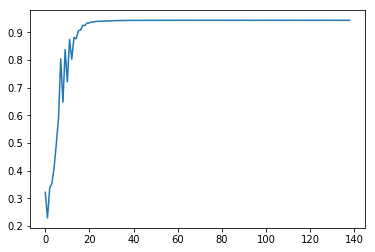

In [38]:
print T.reshape((3,4))
plt.plot(scores);
print max(scores), scores[-1]

# Export parameters and score plots

In [39]:
params_fp = \
DataManager.get_alignment_result_filepath(stack_m=stack_moving, stack_f=stack_fixed,
                                          vol_type_f='annotationAsScore', vol_type_m='annotationAsScore',
                                          warp_setting=warp_setting, what='parameters')
DataManager.save_alignment_parameters(params_fp, T, 
                                      aligner.centroid_m, aligner.centroid_f,
                                      aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, 
                                      aligner.xdim_f, aligner.ydim_f, aligner.zdim_f)
upload_to_s3(params_fp)

##################################

history_fp = DataManager.get_alignment_result_filepath(stack_m=stack_moving, stack_f=stack_fixed,
                                                       vol_type_f='annotationAsScore', vol_type_m='annotationAsScore',
                                                       warp_setting=warp_setting, what='scoreHistory')
bp.pack_ndarray_file(np.array(scores), history_fp)
upload_to_s3(history_fp)

##################################

score_plot_fp = DataManager.get_alignment_result_filepath(stack_m=stack_moving, stack_f=stack_fixed, 
                                                          vol_type_f='annotationAsScore', vol_type_m='annotationAsScore',
                                                          warp_setting=warp_setting, what='scoreEvolution')
fig = plt.figure();
plt.plot(scores);
plt.savefig(score_plot_fp, bbox_inches='tight')
plt.close(fig)

upload_to_s3(score_plot_fp)

##################################

trajectory_fp = DataManager.get_alignment_result_filepath(stack_m=stack_moving, stack_f=stack_fixed,
                                                          vol_type_f='annotationAsScore', vol_type_m='annotationAsScore',
                                                          warp_setting=warp_setting, what='trajectory')
bp.pack_ndarray_file(np.array(traj), trajectory_fp)
upload_to_s3(trajectory_fp)

aws s3 cp "/shared/CSHL_registration_parameters/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_parameters.txt" "s3://mousebrainatlas-data/CSHL_registration_parameters/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_parameters.txt"
aws s3 cp "/shared/CSHL_registration_parameters/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_scoreHistory.bp" "s3://mousebrainatlas-data/CSHL_registration_parameters/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_scoreHistory.bp"
aws s3 cp "/shared/CSHL_registration_parameters/MD594/MD594_do

## Transform midplane-aligned integer-valued volume

In [40]:
stack_fixed = 'MD589'
# stack_moving = 'MD589'
stack_moving = 'MD594'
# stack_moving = 'MD585'

In [41]:
# Sanity check

# for z in range(70, 85, 5):
#     plt.figure(figsize=(20,20));
# #     a = (volume_m_int_midplaneAligned_inbbox==structure_to_label_moving['IC'])[..., z].astype(np.int)
# #     b = (volume_moving_midplaneAligned_overall[structure_to_label_moving['IC']])[..., z].astype(np.int)
# #     print np.count_nonzero(a != b)
#     plt.imshow((volume_m_int_midplaneAligned_inbbox==structure_to_label_moving['IC'])[..., z].astype(np.int), alpha=.3)
#     plt.imshow((volume_moving_midplaneAligned_overall[structure_to_label_moving['IC']])[..., z].astype(np.int), alpha=.3)
#     plt.show();

In [117]:
# volume_m_int_midplaneAligned_inbbox = DataManager.load_transformed_volume(stack_m=stack_moving, stack_f=stack_fixed, 
#                                                    warp_setting=upstream_warp_setting, 
#                                                     vol_type_m='annotation', 
#                                                     vol_type_f='annotation')

In [118]:
# volume_m_int_midplaneAligned_bbox_rel2fixed = DataManager.load_transformed_volume_bbox(stack_m=stack_moving, 
#                                                                                        stack_f=stack_fixed, 
#                                                    warp_setting=upstream_warp_setting, 
#                                                     vol_type_m='annotation', 
#                                                     vol_type_f='annotation')

In [42]:
global_params, centroid_m_rel2midplaneAligned, centroid_f_rel2fixed, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
T, aligner.centroid_m, aligner.centroid_f, aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, aligner.xdim_f, aligner.ydim_f, aligner.zdim_f

In [43]:
# global_params, centroid_m, centroid_f, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
# DataManager.load_alignment_parameters(stack_f=stack_fixed, stack_m=stack_moving, 
#                                       vol_type_f='annotationAsScore', vol_type_m='annotationAsScore',
#                                       warp_setting=warp_setting)

In [44]:
volume_m_int_alignedToFixed_inbbox, volume_m_int_alignedToFixed_bbox_rel2fixed = \
transform_volume_v2(vol=volume_m_int_midplaneAligned_inbbox, 
                                           tf_params=global_params, 
                                           centroid_m=centroid_m_rel2midplaneAligned, 
                                           centroid_f=centroid_f_rel2fixed)

In [46]:
# Transform midplane-aligned volumes to final volumes.

volume_m_alignedToFixed_rel2midplaneAligned = {label: transform_volume_v2(vol, tf_params=global_params, 
                                            centroid_m=centroid_m_rel2midplaneAligned, 
                                            centroid_f=centroid_f_rel2fixed) 
                    for label, vol in volume_moving_midplaneAligned_overall.iteritems()}

In [ ]:
# volume_m_aligned_bbox_rel2midplaneAligned = get_overall_bbox(vol_bbox_tuples=volume_m_aligned_rel2midplaneAligned.values())
# volume_m_aligned_bbox_rel2fixed = volume_m_aligned_bbox_rel2midplaneAligned + volume_m_int_midplane_aligned_bbox_rel2fixed[[0,0,2,2,4,4]]

In [48]:
volume_m_alignedToFixed_rel2fixed = {l: (v,b_rel2midplaneAligned + np.array(volume_m_int_midplaneAligned_bbox_rel2fixed)[[0,0,2,2,4,4]]) 
    for l, (v,b_rel2midplaneAligned) in volume_m_alignedToFixed_rel2midplaneAligned.iteritems()}

In [49]:
volume_m_alignedToFixed, volume_m_alignedToFixed_bbox_rel2fixed = convert_vol_bbox_dict_to_overall_vol(volume_m_alignedToFixed_rel2fixed)

In [53]:
# Save final aligned volumes.

for label, (vol, bbox_rel2fixed) in volume_m_alignedToFixed_rel2fixed.iteritems():
    
    vol_fp = \
    DataManager.get_transformed_volume_filepath(stack_m=stack_moving, 
                                                stack_f=stack_fixed, 
                                                structure=label_to_structure_moving[label], 
                                                vol_type_m='annotationAsScore', 
                                                vol_type_f='annotationAsScore', 
                                                warp_setting=warp_setting)
    
    create_parent_dir_if_not_exists(vol_fp)
    bp.pack_ndarray_file(vol, vol_fp)
    upload_to_s3(vol_fp)
    
    
    bbox_fp = \
    DataManager.get_transformed_volume_bbox_filepath(stack_m=stack_moving, 
                                                stack_f=stack_fixed, 
                                                structure=label_to_structure_moving[label], 
                                                vol_type_m='annotationAsScore', 
                                                vol_type_f='annotationAsScore', 
                                                warp_setting=warp_setting)
    
    create_parent_dir_if_not_exists(bbox_fp)
    np.savetxt(bbox_fp, bbox_rel2fixed)
    upload_to_s3(bbox_fp)

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_10N_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_10N_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_10N_L_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_10N_L_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD5

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_6N_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_6N_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_6N_L_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_6N_L_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_d

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_DC_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_DC_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_DC_L_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_DC_L_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_d

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_Pn_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_Pn_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_Pn_L_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_Pn_L_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_d

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_SNR_R.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_SNR_R.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_SNR_R_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_SNR_R_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD5

aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_VCA_L.bp" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_VCA_L.bp"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_VCA_L_bbox.txt" "s3://mousebrainatlas-data/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume/score_volumes/MD594_down32_annotationAsScoreVolume_warp9_MD589_down32_annotationAsScoreVolume_VCA_L_bbox.txt"
aws s3 cp "/shared/CSHL_volumes/MD594/MD594_down32_annotationAsScoreVolume_warp9_MD5

In [54]:
volume_f_int = DataManager.load_annotation_volume(stack=stack_fixed, downscale=32)

# Visualize

In [55]:
from registration_utilities import find_contour_points

In [56]:
# wrt. uncropped aligned space.

ann_vol_f_xmin_rel2uncropped, _, ann_vol_f_ymin_rel2uncropped, _, ann_vol_f_zmin_rel2uncropped, _ = \
DataManager.load_original_volume_bbox(stack=stack_fixed, volume_type='annotation', downscale=32)

In [57]:
cropbox_f_xmin_rel2uncropped, cropbox_f_ymin_rel2uncropped = DataManager.load_cropbox(stack=stack_fixed)[[0,2]]

secmin = DataManager.load_cropbox(stack=stack_fixed)[4]
cropbox_f_zmin_rel2uncropped = np.round(np.mean(DataManager.convert_section_to_z(stack=stack_fixed, sec=secmin, downsample=32, z_begin=0)))

In [58]:
stack_colors = {stack_fixed: (255,0,0), stack_moving: (0,255,0)}

In [59]:
# for x in range(0, 400, 20):
#     plt.figure(figsize=(10,10));
# #     plt.imshow(volume_f_int[:, x, :], alpha=.5)
# #     plt.imshow(volume_m_int_midplane_aligned[:, x, :], alpha=.5)
#     plt.imshow(volume_m_int_midplane_aligned[:, x, :])
#     plt.show();

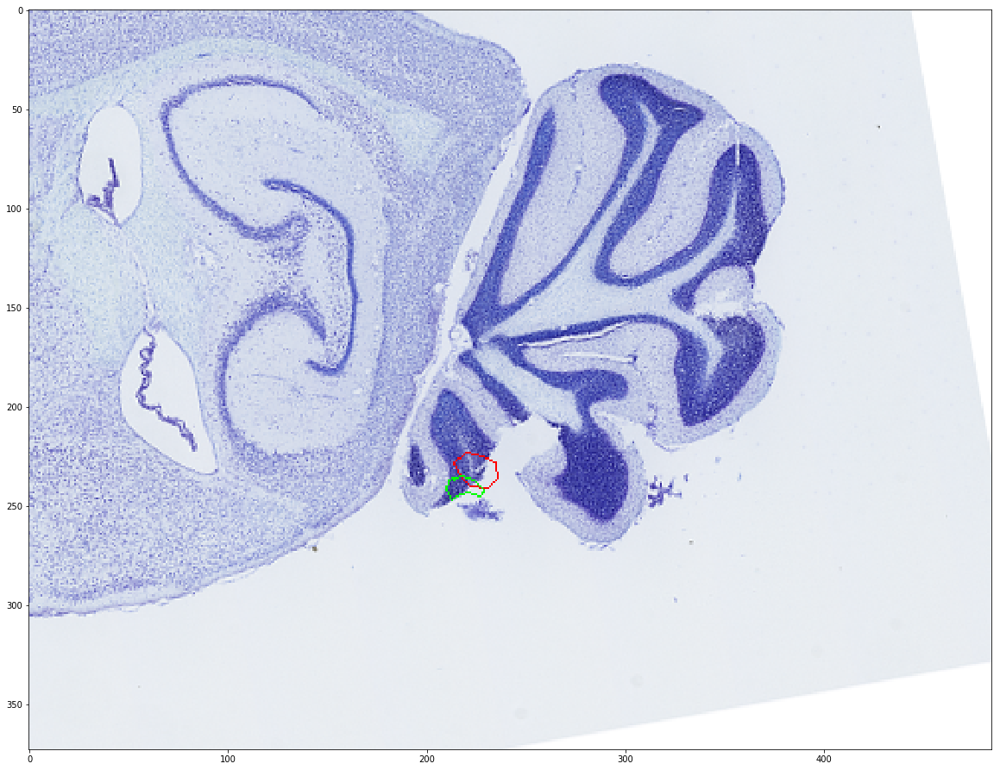

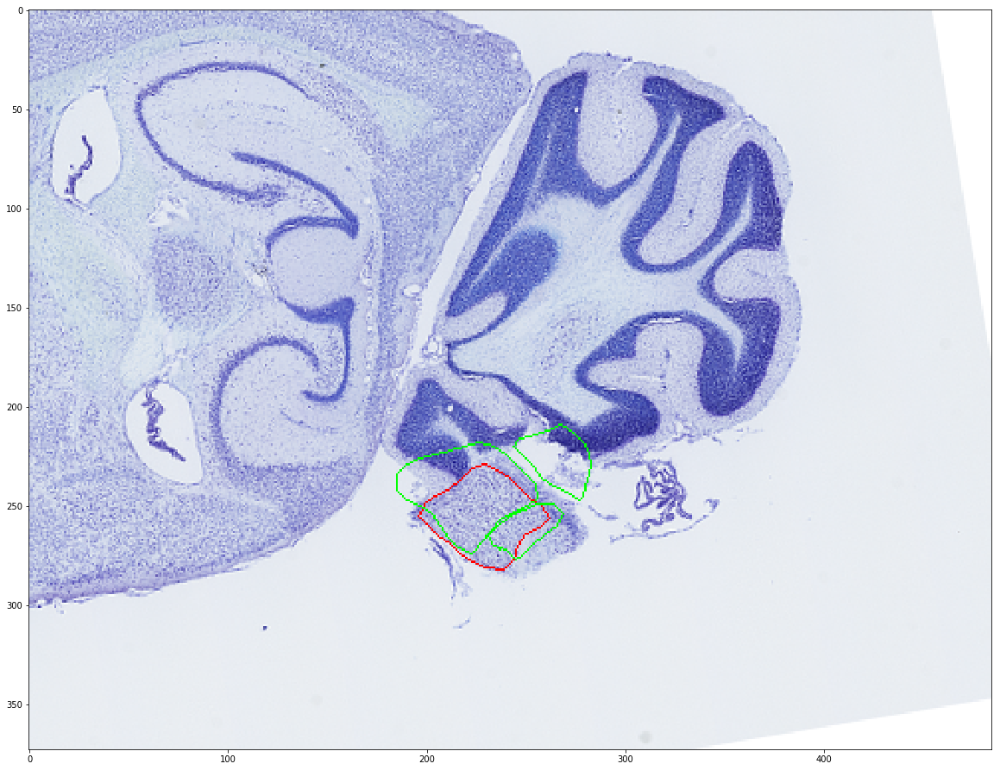

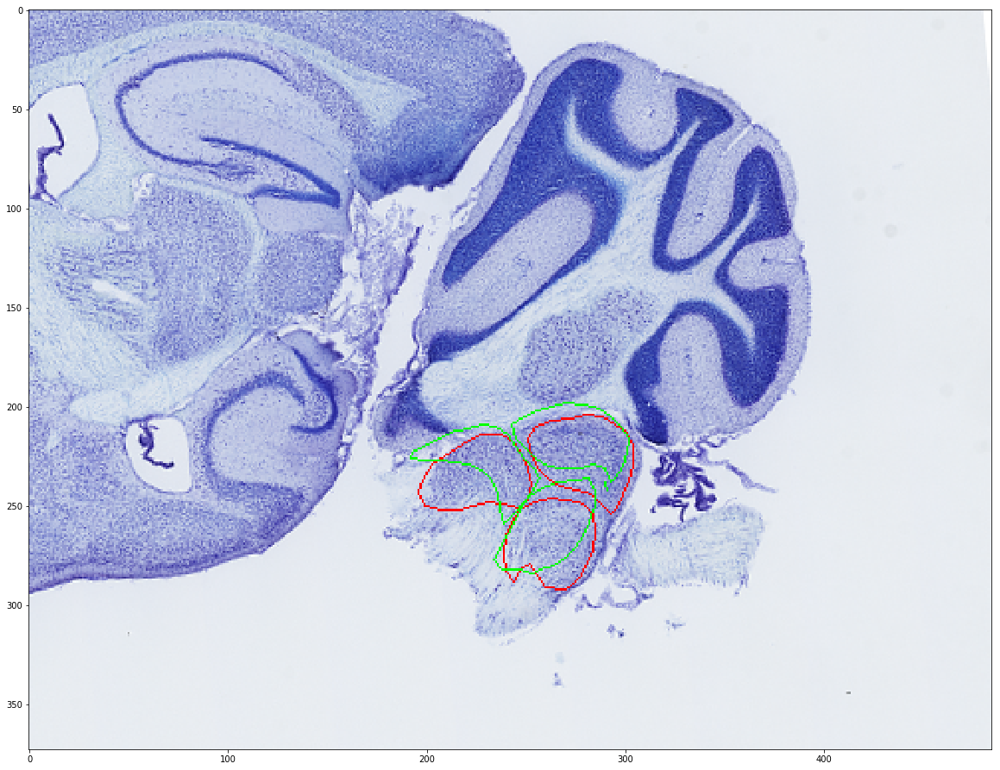

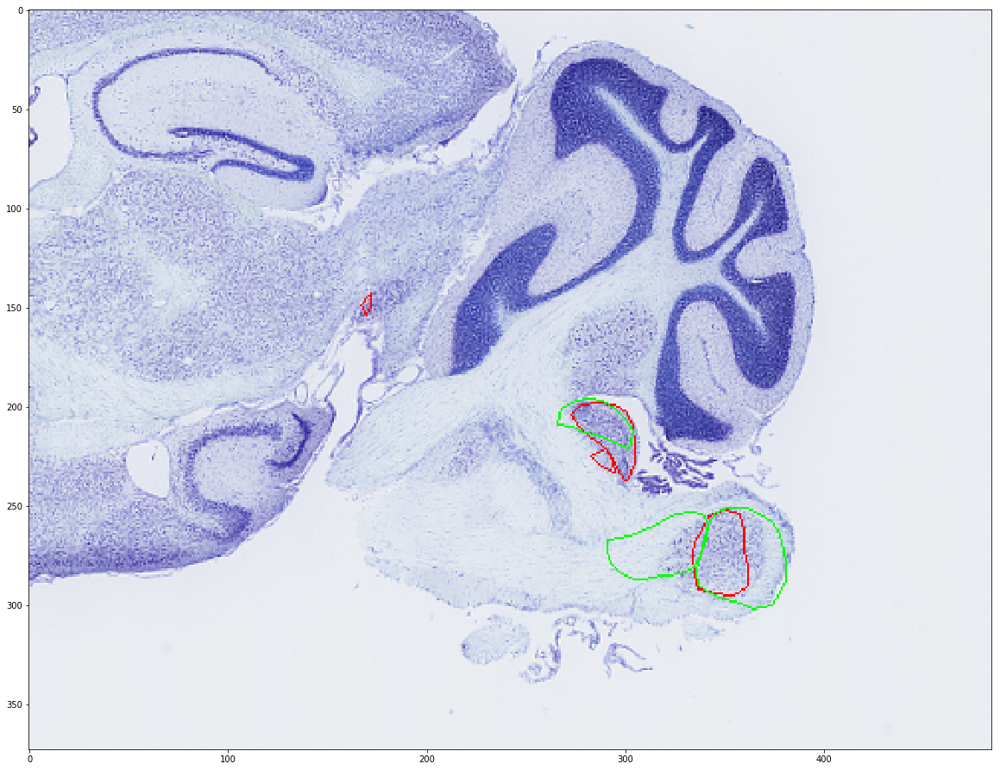

/usr/local/lib/python2.7/dist-packages/skimage/external/tifffile/tifffile.py:2611: RuntimeWarning: py_decodelzw encountered unexpected end of stream
  strip = decompress(strip)


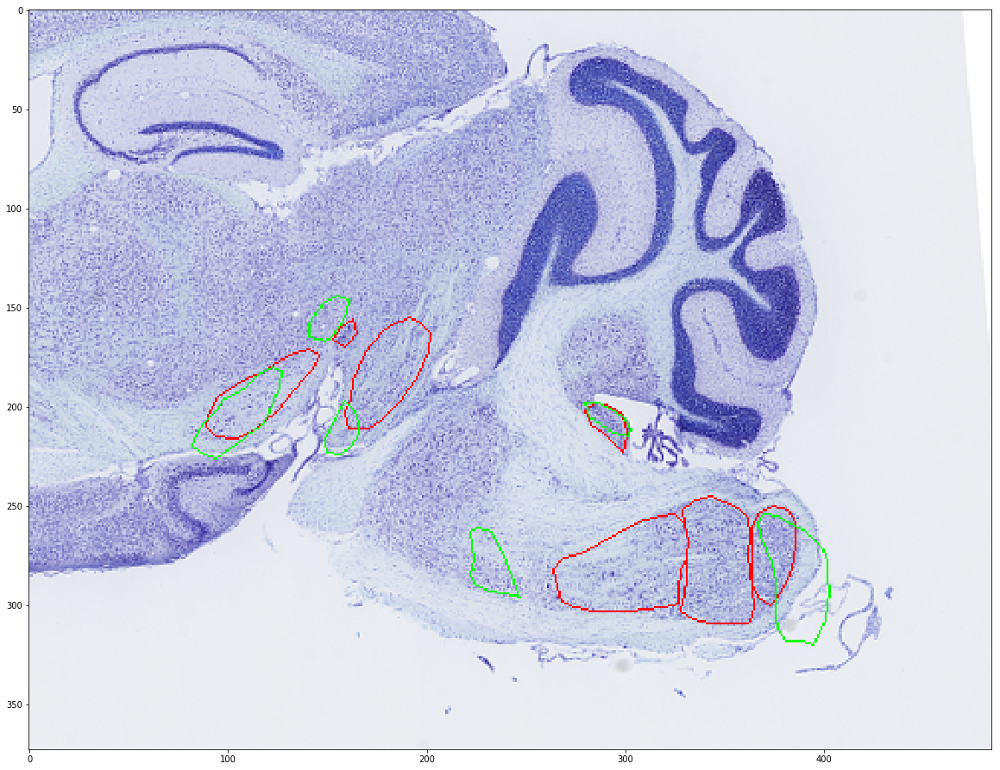

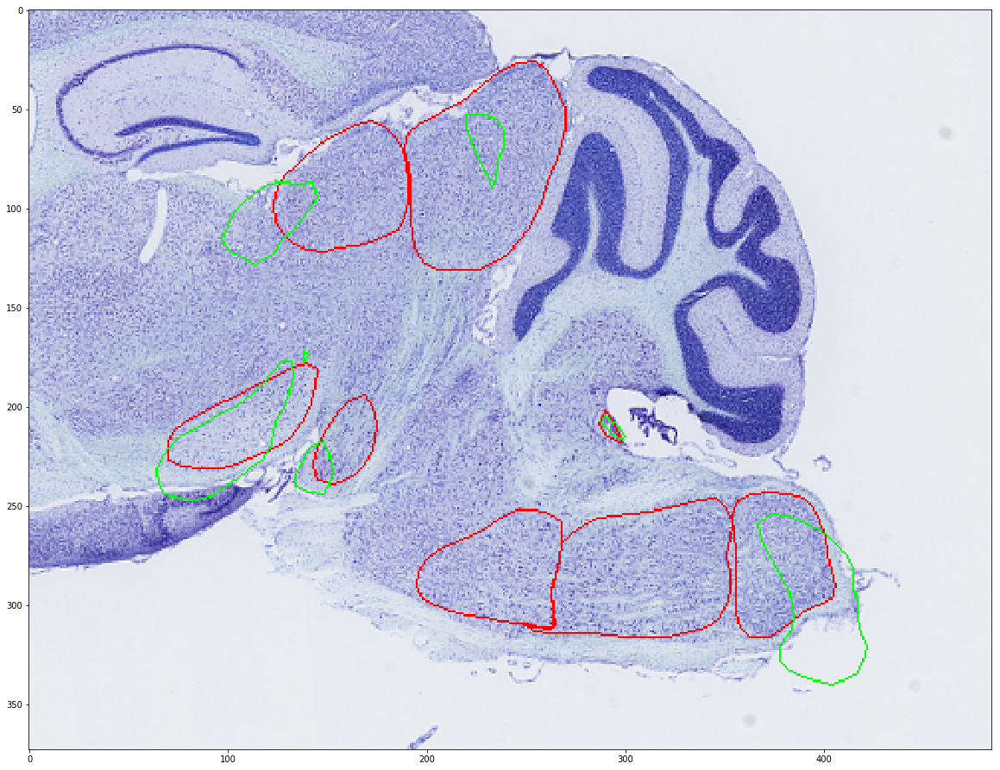

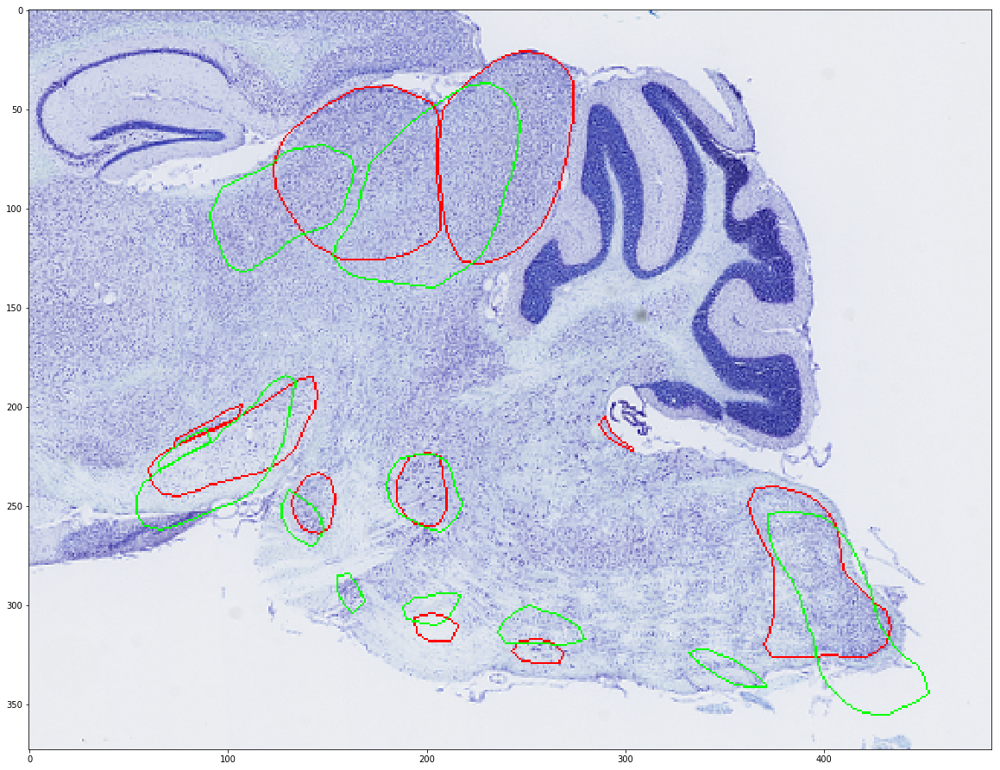

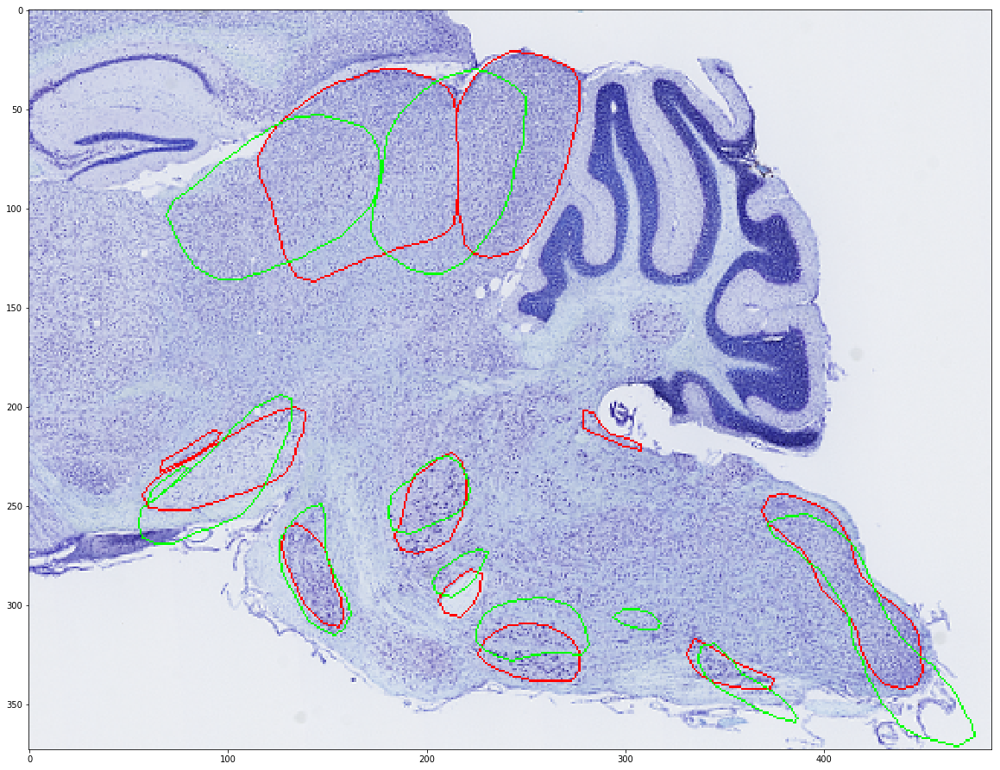

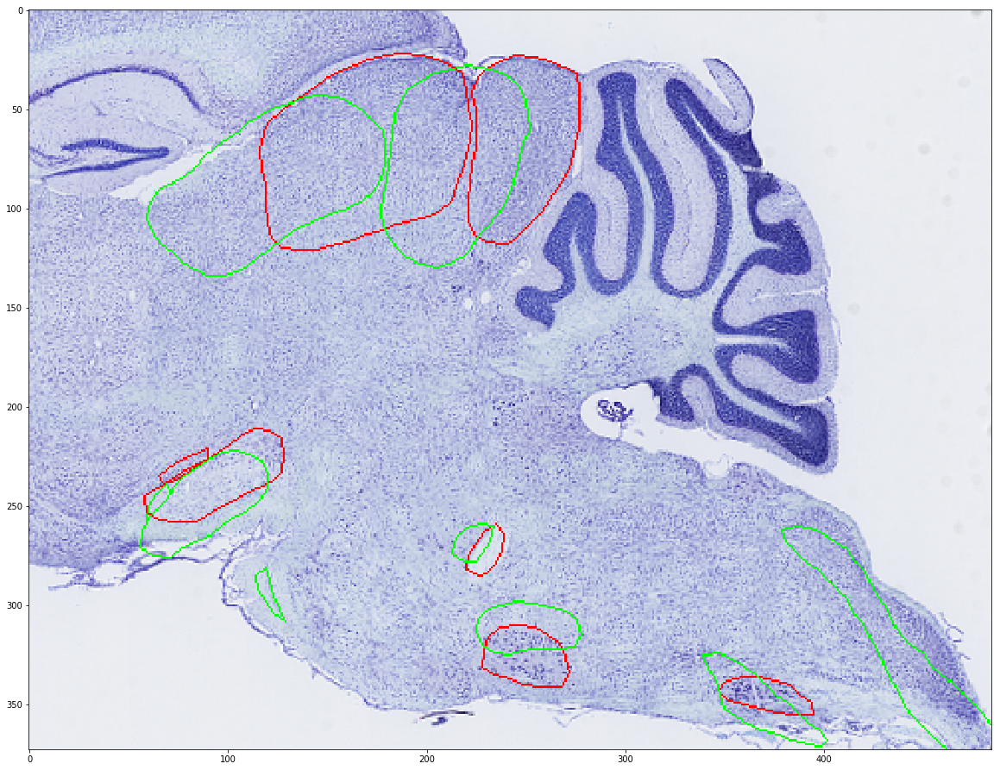

...

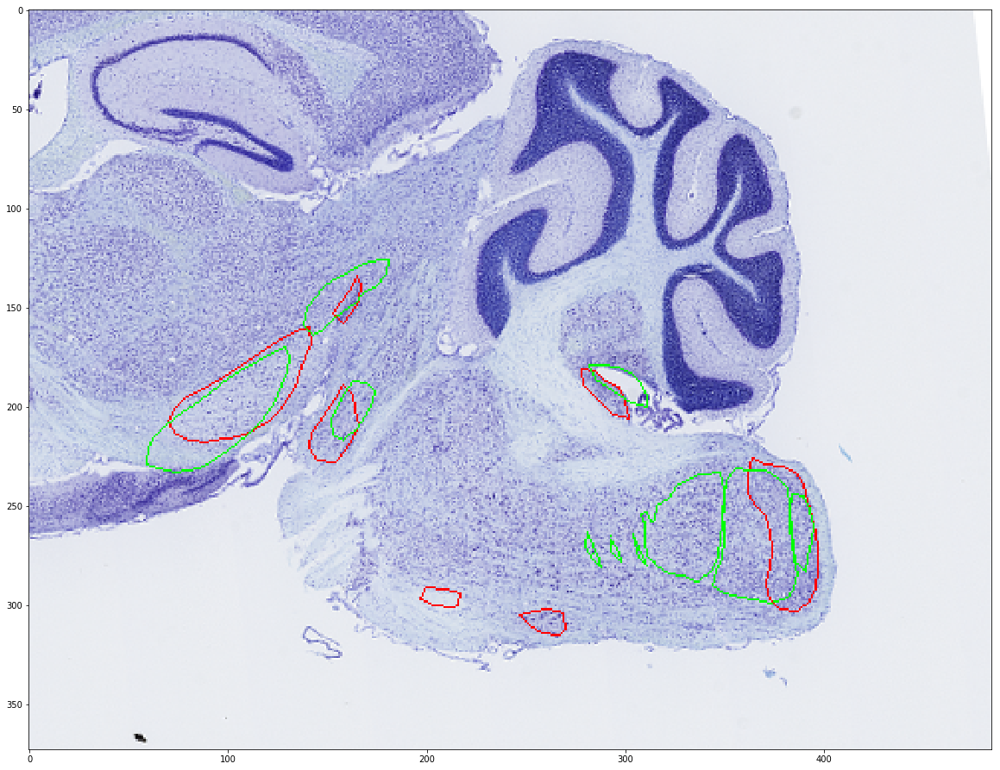

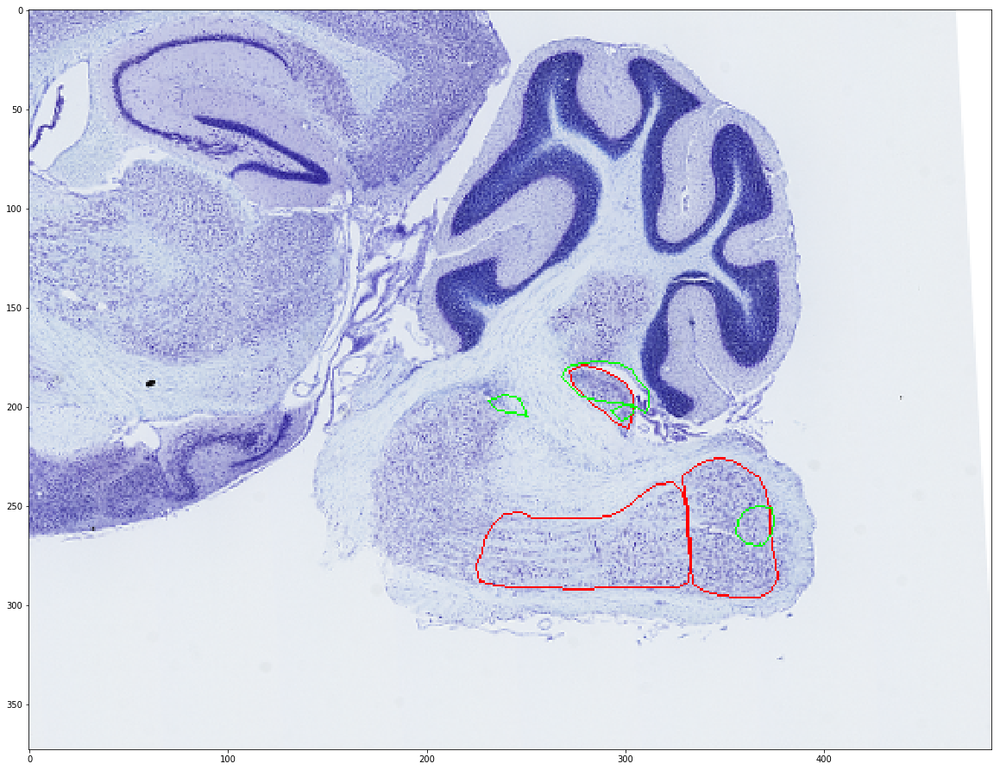

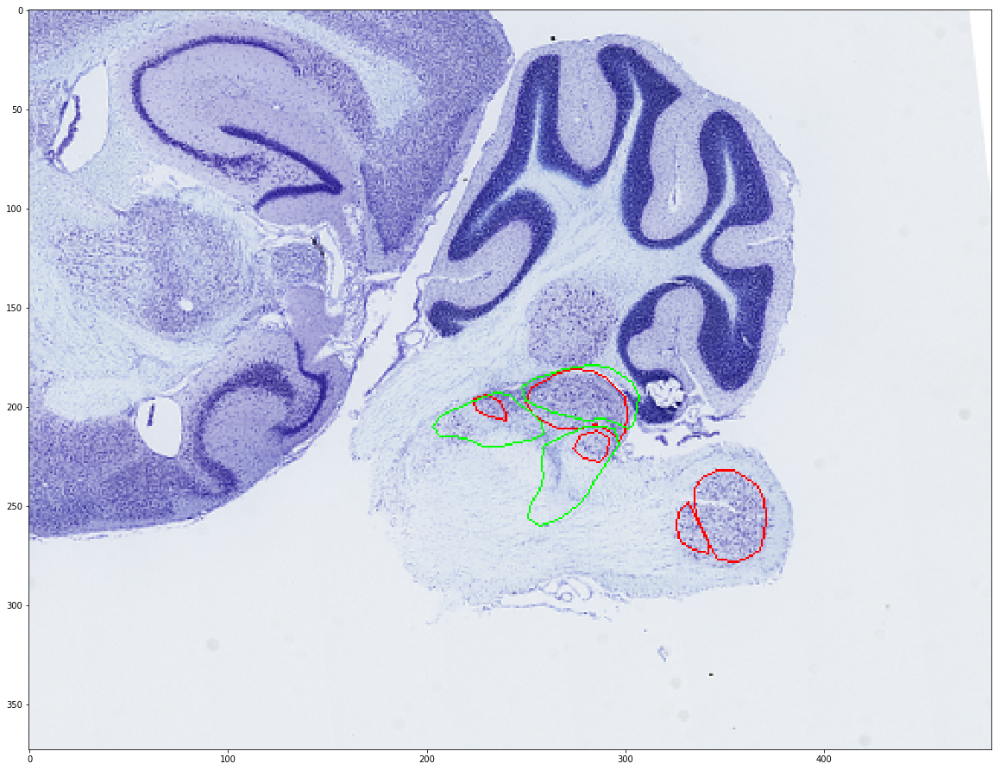

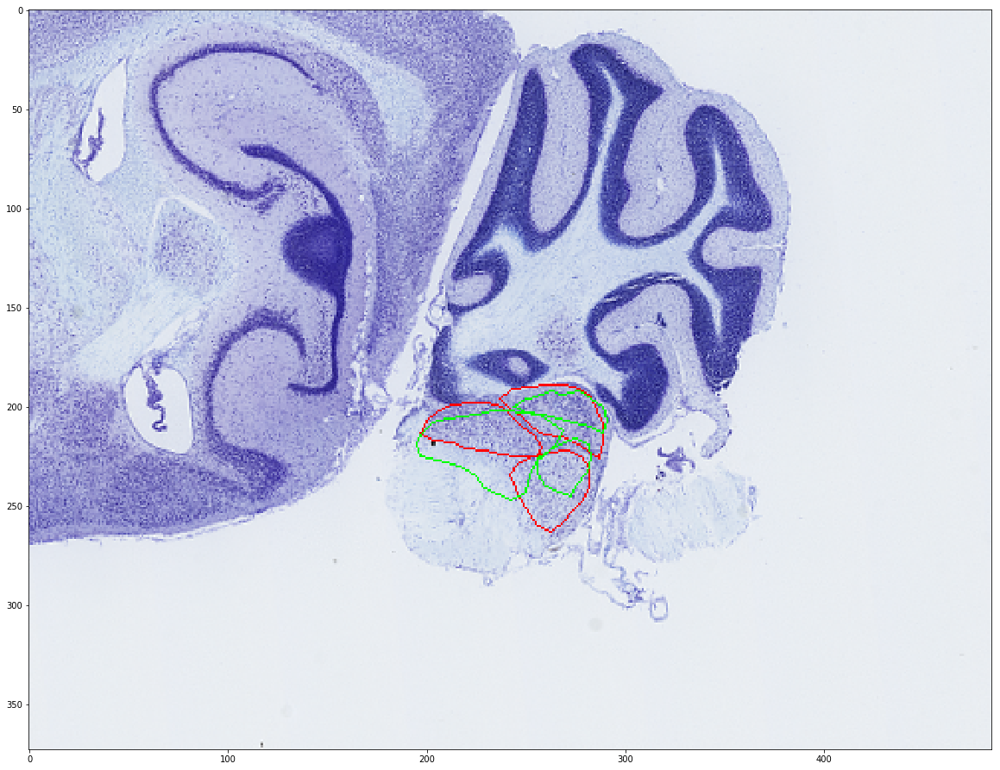

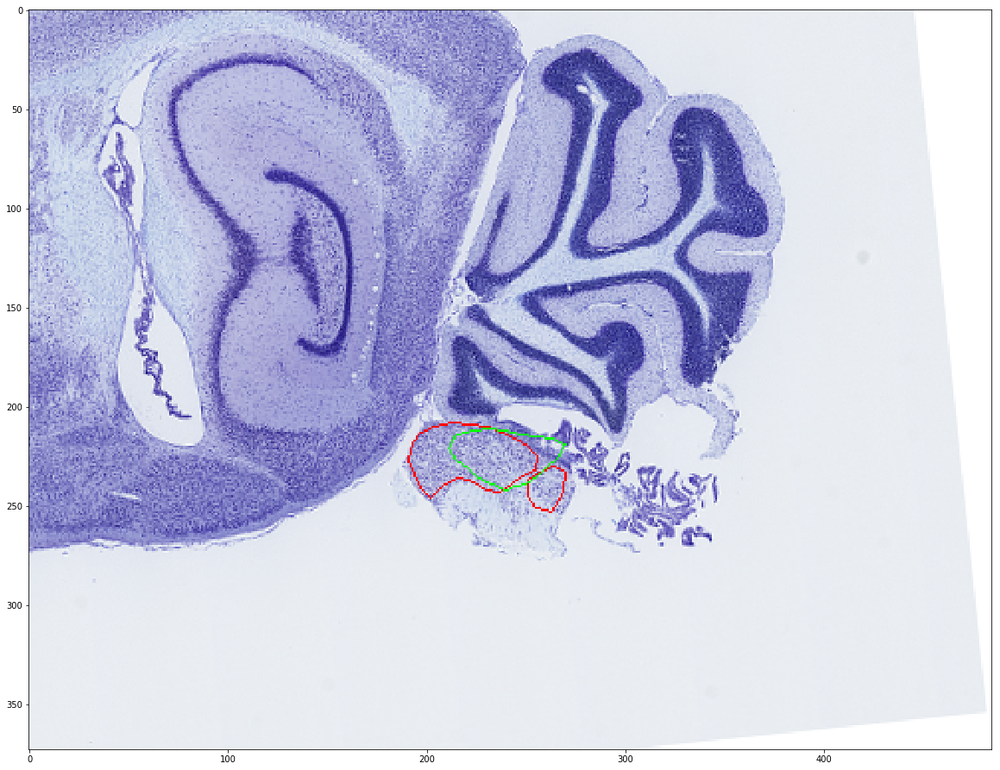

IndexError: index 373 is out of bounds for axis 2 with size 367

In [60]:
for sec in metadata_cache['valid_sections'][stack_fixed][::10]:
        
    img = DataManager.load_image_v2(stack=stack_fixed, section=sec, resol='thumbnail', prep_id=2)

    viz = img.copy()
    z_rel2uncropped = np.round(np.mean(DataManager.convert_section_to_z(stack=stack_fixed, sec=sec, downsample=32, z_begin=0)))
#     z_rel2cropped = z_rel2uncropped - cropbox_f_zmin_rel2uncropped
    z_rel2annFixed = z_rel2uncropped - ann_vol_f_zmin_rel2uncropped
    
    #######################
    
    contours_f_rel2fixed = find_contour_points(volume_f_int[..., int(z_rel2annFixed)])
    contours_f_rel2cropped = {i: [cnt_rel2fixed + (ann_vol_f_xmin_rel2uncropped, ann_vol_f_ymin_rel2uncropped) - (cropbox_f_xmin_rel2uncropped, cropbox_f_ymin_rel2uncropped) 
                                 for cnt_rel2fixed in cnts_rel2fixed] 
                             for i, cnts_rel2fixed in contours_f_rel2fixed.iteritems()}

    for ind_f, cnts_f_rel2cropped in contours_f_rel2cropped.iteritems():
        for cnt_f_rel2cropped in cnts_f_rel2cropped:
            cv2.polylines(viz, [cnt_f_rel2cropped.astype(np.int)], True, stack_colors[stack_fixed], 1)
            
    ########################
    
    contours_m_alignedToFixed_rel2alignedToFixed = \
    find_contour_points(volume_m_int_alignedToFixed_inbbox[..., int(z_rel2uncropped - ann_vol_f_zmin_rel2uncropped + volume_m_int_alignedToFixed_bbox_rel2fixed[4])])
    contours_m_alignedToFixed_rel2cropped = {i: [cnt_rel2alignedToFixed + \
                                                 np.array(volume_m_int_alignedToFixed_bbox_rel2fixed)[[0,2]] + \
                                                 (ann_vol_f_xmin_rel2uncropped, ann_vol_f_ymin_rel2uncropped) - \
                                                 (cropbox_f_xmin_rel2uncropped, cropbox_f_ymin_rel2uncropped)
                                                 for cnt_rel2alignedToFixed in cnts_rel2alignedToFixed] 
                                         for i, cnts_rel2alignedToFixed in contours_m_alignedToFixed_rel2alignedToFixed.iteritems()}

    for ind_m, cnts_m_rel2cropped in contours_m_alignedToFixed_rel2cropped.iteritems():
        for cnt_m_rel2cropped in cnts_m_rel2cropped:
            cv2.polylines(viz, [cnt_m_rel2cropped.astype(np.int)], True, stack_colors[stack_moving], 1)

    #########################
            
    plt.figure(figsize=(20,20));
    plt.imshow(viz)
    plt.show();
    
#     viz_fn = os.path.join(viz_dir, '%(stack_moving)s_to_%(stack_fixed)s_%(sec)04d.jpg' % \
#           {'stack_moving': stack_moving, 'stack_fixed': stack_fixed, 'sec': sec})
#     imsave(viz_fn, viz[:800, :1200])

# END

In [24]:
volume_m_alignedTo_f_fn = os.path.join(atlasAlignParams_dir, '%(stack_moving)s_down32_annotationVolume_alignedTo_%(stack_fixed)s_down32_annotationVolume.bp' % \
                                       {'stack_moving': stack_moving, 'stack_fixed': stack_fixed})

In [21]:
from annotation_utilities import fill_sparse_volume
volume_m_aligned_to_f_densified = fill_sparse_volume(volume_m_aligned_to_f)

In [ ]:
# bp.pack_ndarray_file(volume_m_aligned_to_f_densified, volume_m_alignedTo_f_fn)

In [ ]:
# Create voxel occupancy-based probabilistic volume

In [35]:
aggregated_structure_volumes = {}
aggregated_structure_volume_bbox = {}

for label, name_s in label_to_name_fixed.iteritems():
    
    aggregated_volume_aligned_to_f = ((volume_m_aligned_to_f_densified == label).astype(np.int8) + (volume_fixed == label).astype(np.int8)) / 2.
    
    xmin, xmax, ymin, ymax, zmin, zmax = bbox_3d(aggregated_volume_aligned_to_f > 0)
    vol = aggregated_volume_aligned_to_f[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1]
    
    aggregated_structure_volume_bbox[name_s] = (xmin, xmax, ymin, ymax, zmin, zmax)
    aggregated_structure_volumes[name_s] = vol.astype(np.float16).copy()
    
#     output_dir = create_if_not_exists(os.path.join(VOLUME_ROOTDIR, 'atlas_to_%(stack_f)s' % dict(stack_f=stack_fixed)))
#     vol_fn = os.path.join(output_dir, 'atlas_to_%(stack_f)s_%(name_s)s.bp' % dict(stack_f=stack_fixed, name_s=name_s))
#     bbox_fn = os.path.join(output_dir, 'atlas_to_%(stack_f)s_%(name_s)s_bbox.txt' % dict(stack_f=stack_fixed, name_s=name_s))
    
#     bp.pack_ndarray_file(vol, vol_fn)
#     np.savetxt(bbox_fn, np.array((xmin, xmax, ymin, ymax, zmin, zmax))[None])

In [25]:
paired_structures = ['5N', '6N', '7N', '7n', 'Amb', 'LC', 'LRt', 'Pn', 'Tz', 'VLL', 'RMC', 'SNC', 'SNR', '3N', '4N',
                    'Sp5I', 'Sp5O', 'Sp5C', 'PBG', '10N', 'VCA', 'VCP', 'DC']
singular_structures = ['AP', '12N', 'RtTg', 'SC', 'IC']
structures = paired_structures + singular_structures

In [39]:
atlas_score_volumes = {}

for name_u in structures:
# for name_u in ['7N']:
    
    print name_u
    
    if name_u in singular_structures:

        atlas_score_volume = np.zeros_like(volume_fixed, np.float16)
        
        xmin, xmax, ymin, ymax, zmin, zmax = aggregated_structure_volume_bbox[name_u]
        atlas_score_volume[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1] = aggregated_structure_volumes[name_u]
        
        atlas_score_volumes[name_u] = atlas_score_volume.copy()
        
    else:
        
        atlas_score_volume = np.zeros_like(volume_fixed, np.float16)
    
        lname = convert_to_left_name(name_u)

        xmin, xmax, ymin, ymax, zmin, zmax = aggregated_structure_volume_bbox[lname]

        atlas_score_volume[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1] = aggregated_structure_volumes[lname]
        
        atlas_score_volumes[name_u] = atlas_score_volume.copy()
        
        vol_fn = DataManager.get_score_volume_filepath(stack='atlas_on_MD589', label=lname, downscale=32)
        bp.pack_ndarray_file(atlas_score_volume, vol_fn)
        
        ###############################
        
        atlas_score_volume = np.zeros_like(volume_fixed, np.float16)

        rname = convert_to_right_name(name_u)

        xmin, xmax, ymin, ymax, zmin, zmax = aggregated_structure_volume_bbox[rname]
                
        atlas_score_volume[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1] = aggregated_structure_volumes[rname]
        
        atlas_score_volumes[name_u] = atlas_score_volume.copy()
        
        vol_fn = DataManager.get_score_volume_filepath(stack='atlas_on_MD589', label=rname, downscale=32)
        bp.pack_ndarray_file(atlas_score_volume, vol_fn)

5N
6N
7N
7n
Amb
LC
LRt
Pn
Tz
VLL
RMC
SNC
SNR
3N
4N
Sp5I
Sp5O
Sp5C
PBG
10N
VCA
VCP
DC
AP
12N
RtTg
SC
IC


In [79]:
# for name_u, vol in atlas_score_volumes.iteritems():
    
#     output_dir = create_if_not_exists(os.path.join(VOLUME_ROOTDIR, 'atlas_on_%(stack_f)s' % dict(stack_f=stack_fixed), 'score_volumes'))
#     vol_fn = os.path.join(output_dir, 'atlas_on_%(stack_f)s_down32_scoreVolume_%(name)s.bp' % dict(stack_f=stack_fixed, name=name_u))
#     bp.pack_ndarray_file(vol, vol_fn)

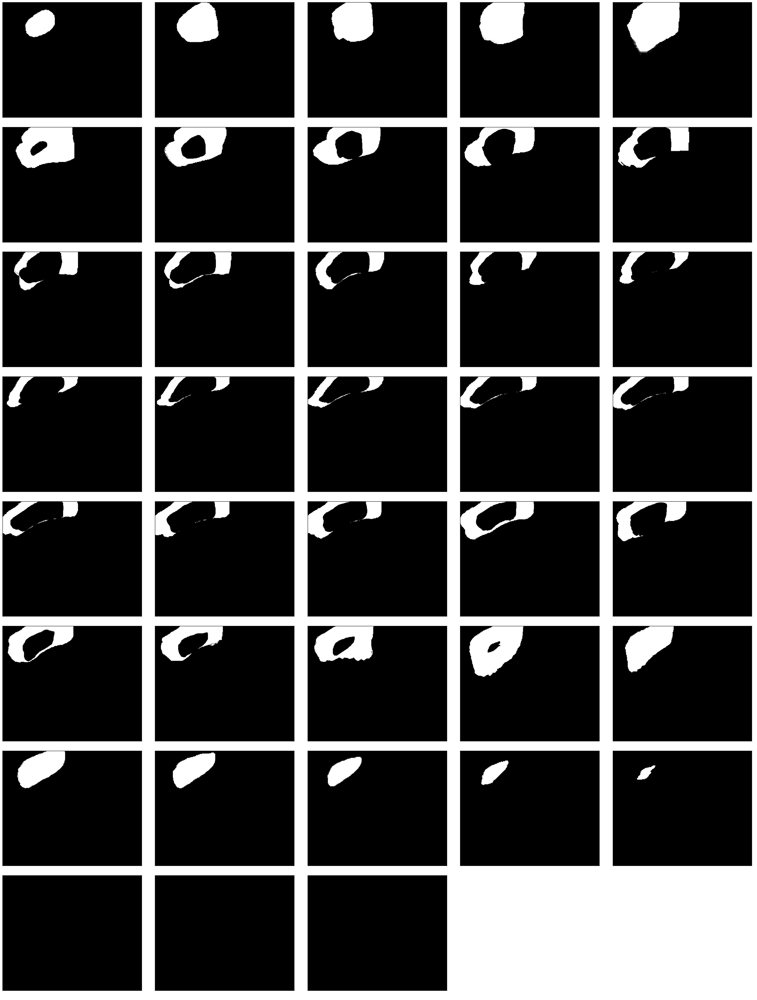

In [8]:
name_u = 'SC_surround'

output_dir = os.path.join(VOLUME_ROOTDIR, 'atlas_on_%(stack_f)s' % dict(stack_f=stack_fixed), 'score_volumes')
vol_fn = os.path.join(output_dir, 'atlas_on_%(stack_f)s_down32_scoreVolume_%(name)s.bp' % dict(stack_f=stack_fixed, name=name_u))

vol = bp.unpack_ndarray_file(vol_fn)

ims = [vol[:, :, z] for z in range(0, vol.shape[2], 10)]

display_images_in_grids(ims, 5, cmap=plt.cm.gray, vmin=0, vmax=1)

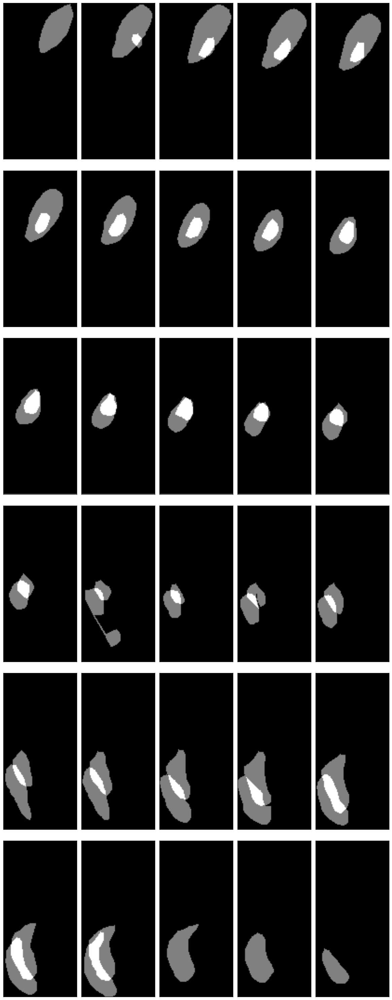

In [56]:
name_s = 'VLL_L'
ims = [aggregated_structure_volumes[name_s][:, :, z] 
       for z in range(0, aggregated_structure_volumes[name_s].shape[2], 2)]

display_images_in_grids(ims, 5, cmap=plt.cm.gray, vmin=0, vmax=1)

In [111]:
# Generate volumes for landmark surround regions

In [8]:
import scipy.ndimage as nd
from skimage.morphology import label

In [9]:
enlarge_factor = 1.5

In [26]:
structures_sided = sum([[n] if n in singular_structures 
                        else [convert_to_left_name(n), convert_to_right_name(n)] 
                        for n in structures], [])

In [48]:
stack_fixed = 'MD589'

output_dir = os.path.join(VOLUME_ROOTDIR, 'atlas_on_%(stack_f)s' % dict(stack_f=stack_fixed), 'score_volumes')

for name_s in structures_sided:
# for name_s in ['AP']:
    
    print name_s

    vol_fn = os.path.join(output_dir, 'atlas_on_%(stack_f)s_down32_scoreVolume_%(name)s.bp' % dict(stack_f=stack_fixed, name=name_s))
    vol = bp.unpack_ndarray_file(vol_fn)

    labeled_volume, num_components = label(vol > 0, return_num=True)
    
    overall_volume = np.zeros(vol.shape, np.float16)
    overall_ydim, overall_xdim, overall_zdim = overall_volume.shape

    for l in range(1, 1+num_components):

        ys, xs, zs = np.where(labeled_volume == l)

        centroid_y = ys.mean().astype(np.int)
        centroid_x = xs.mean().astype(np.int)
        centroid_z = zs.mean().astype(np.int)

        xmin, xmax, ymin, ymax, zmin, zmax = bbox_3d(labeled_volume == l)

        cropped_vol = labeled_volume[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1] == l
        cropped_vol_ydim, cropped_vol_xdim, cropped_vol_zdim = cropped_vol.shape

        enlarged_vol = nd.interpolation.zoom(cropped_vol.astype(np.float), zoom=enlarge_factor) > .1
        enlarged_ydim, enlarged_xdim, enlarged_zdim = enlarged_vol.shape

        center_y, center_x, center_z = np.array(enlarged_vol.shape)/2

        enlarged_vol[center_y-cropped_vol_ydim/2:center_y+cropped_vol_ydim-cropped_vol_ydim/2,
                     center_x-cropped_vol_xdim/2:center_x+cropped_vol_xdim-cropped_vol_xdim/2,
                     center_z-cropped_vol_zdim/2:center_z+cropped_vol_zdim-cropped_vol_zdim/2][cropped_vol] = 0
        
        proposed_sub_xmin = centroid_x - enlarged_xdim/2
        proposed_sub_xmax = proposed_sub_xmin + enlarged_xdim - 1
        
        proposed_sub_zmin = centroid_z - enlarged_zdim/2
        proposed_sub_zmax = proposed_sub_zmin + enlarged_zdim - 1
        
        proposed_sub_ymin = centroid_y - enlarged_ydim/2
        proposed_sub_ymax = proposed_sub_ymin + enlarged_ydim - 1
        
        if proposed_sub_ymin < 0:
            sub_vol_ymin = - proposed_sub_ymin
            sub_vol_ymax = enlarged_ydim - 1
            proposed_sub_ymin = 0
        elif proposed_sub_ymax >= overall_ydim:
            sub_vol_ymin = 0
            sub_vol_ymax = enlarged_ydim - 1 - (proposed_sub_ymax - overall_ydim + 1)
            proposed_sub_ymax = overall_ydim - 1
        else:
            sub_vol_ymin = 0
            sub_vol_ymax = enlarged_ydim - 1

        if proposed_sub_xmin < 0:
            sub_vol_xmin = - proposed_sub_xmin
            sub_vol_xmax = enlarged_xdim - 1
            proposed_sub_xmin = 0
        elif proposed_sub_xmax >= overall_xdim:
            sub_vol_xmin = 0
            sub_vol_xmax = enlarged_xdim - 1 - (proposed_sub_xmax - overall_xdim + 1)
            proposed_sub_xmax = overall_xdim - 1
        else:
            sub_vol_xmin = 0
            sub_vol_xmax = enlarged_xdim - 1

        if proposed_sub_zmin < 0:
            sub_vol_zmin = - proposed_sub_zmin
            sub_vol_zmax = enlarged_zdim - 1
            proposed_sub_zmin = 0
        elif proposed_sub_zmax >= overall_zdim:
            sub_vol_zmin = 0
            sub_vol_zmax = enlarged_zdim - 1 - (proposed_sub_zmax - overall_zdim + 1)
            proposed_sub_zmax = overall_zdim - 1
        else:
            sub_vol_zmin = 0
            sub_vol_zmax = enlarged_zdim - 1

        overall_volume[proposed_sub_ymin:proposed_sub_ymax+1,
                       proposed_sub_xmin:proposed_sub_xmax+1,
                       proposed_sub_zmin:proposed_sub_zmax+1] = \
        enlarged_vol[sub_vol_ymin:sub_vol_ymax+1,
                    sub_vol_xmin:sub_vol_xmax+1,
                    sub_vol_zmin:sub_vol_zmax+1].copy().astype(np.float16)

    vol_fn = DataManager.get_score_volume_filepath(stack='atlas_on_MD589', label=name_s + '_surround', downscale=32)
    bp.pack_ndarray_file(overall_volume, vol_fn)

5N_L
5N_R
6N_L
6N_R
7N_L
7N_R
7n_L
7n_R
Amb_L
Amb_R
LC_L
LC_R
LRt_L
LRt_R
Pn_L
Pn_R
Tz_L
Tz_R
VLL_L
VLL_R
RMC_L
RMC_R
SNC_L
SNC_R
SNR_L
SNR_R
3N_L
3N_R
4N_L
4N_R
Sp5I_L
Sp5I_R
Sp5O_L
Sp5O_R
Sp5C_L
Sp5C_R
PBG_L
PBG_R
10N_L
10N_R
VCA_L
VCA_R
VCP_L
VCP_R
DC_L
DC_R
AP
12N
RtTg
SC
IC


In [49]:
# stack_fixed = 'MD589'

# output_dir = os.path.join(VOLUME_ROOTDIR, 'atlas_on_%(stack_f)s' % dict(stack_f=stack_fixed), 'score_volumes')

# for name_u in structures:
# # for name_u in ['LRt']:
    
#     print name_u

#     vol_fn = os.path.join(output_dir, 'atlas_on_%(stack_f)s_down32_scoreVolume_%(name)s.bp' % dict(stack_f=stack_fixed, name=name_u))
#     vol = bp.unpack_ndarray_file(vol_fn)

#     labeled_volume, num_components = label(vol > 0, return_num=True)
    
#     overall_volume = np.zeros(vol.shape, np.float16)
#     overall_ydim, overall_xdim, overall_zdim = overall_volume.shape

#     for l in range(1, 1+num_components):

#         ys, xs, zs = np.where(labeled_volume == l)

#         centroid_y = ys.mean().astype(np.int)
#         centroid_x = xs.mean().astype(np.int)
#         centroid_z = zs.mean().astype(np.int)

#         xmin, xmax, ymin, ymax, zmin, zmax = bbox_3d(labeled_volume == l)

#         cropped_vol = labeled_volume[ymin:ymax+1, xmin:xmax+1, zmin:zmax+1] == l
#         cropped_vol_ydim, cropped_vol_xdim, cropped_vol_zdim = cropped_vol.shape

#         enlarged_vol = nd.interpolation.zoom(cropped_vol.astype(np.float), zoom=enlarge_factor) > .1
#         enlarged_ydim, enlarged_xdim, enlarged_zdim = enlarged_vol.shape

#         center_y, center_x, center_z = np.array(enlarged_vol.shape)/2

#         enlarged_vol[center_y-cropped_vol_ydim/2:center_y+cropped_vol_ydim-cropped_vol_ydim/2,
#                      center_x-cropped_vol_xdim/2:center_x+cropped_vol_xdim-cropped_vol_xdim/2,
#                      center_z-cropped_vol_zdim/2:center_z+cropped_vol_zdim-cropped_vol_zdim/2][cropped_vol] = 0
        
#         proposed_sub_xmin = centroid_x - enlarged_xdim/2
#         proposed_sub_xmax = proposed_sub_xmin + enlarged_xdim - 1
        
#         proposed_sub_zmin = centroid_z - enlarged_zdim/2
#         proposed_sub_zmax = proposed_sub_zmin + enlarged_zdim - 1
        
#         proposed_sub_ymin = centroid_y - enlarged_ydim/2
#         proposed_sub_ymax = proposed_sub_ymin + enlarged_ydim - 1
        
#         if proposed_sub_ymin < 0:
#             sub_vol_ymin = - proposed_sub_ymin
#             sub_vol_ymax = enlarged_ydim - 1
#             proposed_sub_ymin = 0
#         elif proposed_sub_ymax >= overall_ydim:
#             sub_vol_ymin = 0
#             sub_vol_ymax = enlarged_ydim - 1 - (proposed_sub_ymax - overall_ydim + 1)
#             proposed_sub_ymax = overall_ydim - 1
#         else:
#             sub_vol_ymin = 0
#             sub_vol_ymax = enlarged_ydim - 1

#         if proposed_sub_xmin < 0:
#             sub_vol_xmin = - proposed_sub_xmin
#             sub_vol_xmax = enlarged_xdim - 1
#             proposed_sub_xmin = 0
#         elif proposed_sub_xmax >= overall_xdim:
#             sub_vol_xmin = 0
#             sub_vol_xmax = enlarged_xdim - 1 - (proposed_sub_xmax - overall_xdim + 1)
#             proposed_sub_xmax = overall_xdim - 1
#         else:
#             sub_vol_xmin = 0
#             sub_vol_xmax = enlarged_xdim - 1

#         if proposed_sub_zmin < 0:
#             sub_vol_zmin = - proposed_sub_zmin
#             sub_vol_zmax = enlarged_zdim - 1
#             proposed_sub_zmin = 0
#         elif proposed_sub_zmax >= overall_zdim:
#             sub_vol_zmin = 0
#             sub_vol_zmax = enlarged_zdim - 1 - (proposed_sub_zmax - overall_zdim + 1)
#             proposed_sub_zmax = overall_zdim - 1
#         else:
#             sub_vol_zmin = 0
#             sub_vol_zmax = enlarged_zdim - 1

#         overall_volume[proposed_sub_ymin:proposed_sub_ymax+1,
#                        proposed_sub_xmin:proposed_sub_xmax+1,
#                        proposed_sub_zmin:proposed_sub_zmax+1] = \
#         enlarged_vol[sub_vol_ymin:sub_vol_ymax+1,
#                     sub_vol_xmin:sub_vol_xmax+1,
#                     sub_vol_zmin:sub_vol_zmax+1].copy().astype(np.float16)

# #     vol_fn = os.path.join(output_dir, 'atlas_on_%(stack_f)s_down32_scoreVolume_%(name)s_surround.bp' % dict(stack_f=stack_fixed, name=name_u))
# #     bp.pack_ndarray_file(overall_volume, vol_fn)

In [52]:
vol = DataManager.load_score_volume(stack='atlas_on_MD589', label='VLL_R_surround', downscale=32)

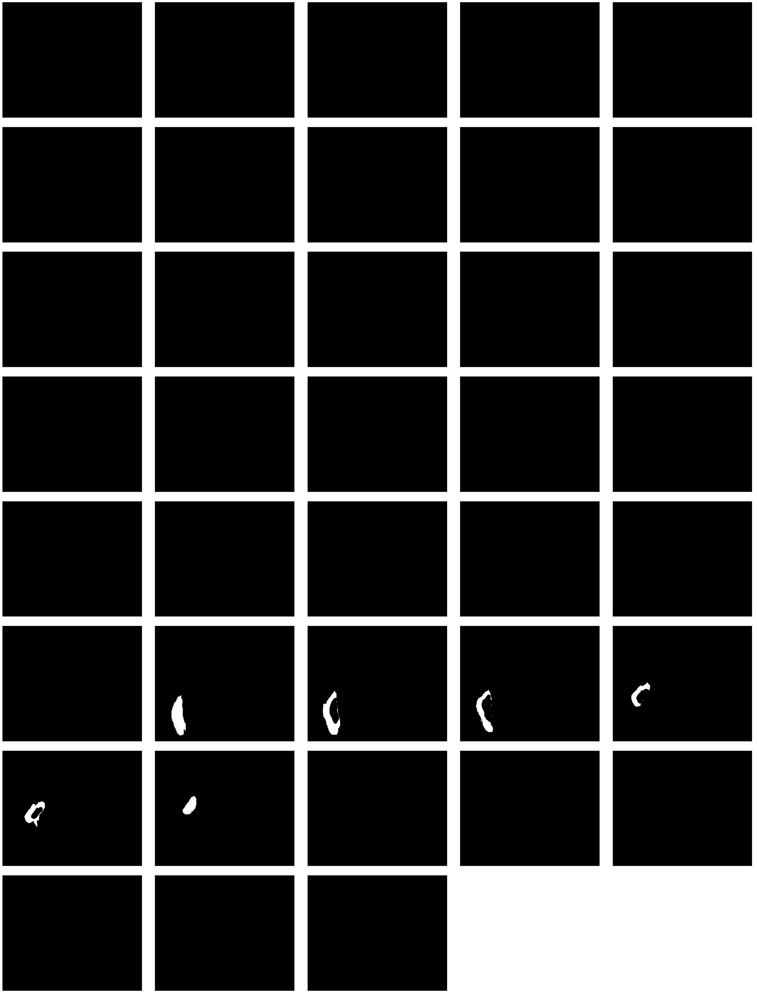

In [53]:
ims = [vol[:, :, z] for z in range(0, vol.shape[2], 10)]
display_images_in_grids(ims, 5, cmap=plt.cm.gray, vmin=0, vmax=1)

In [ ]:
ims = [overall_volume[:, :, z] for z in range(0, overall_volume.shape[2], 2)]
display_images_in_grids(ims, 5, cmap=plt.cm.gray, vmin=0, vmax=1)